# SyriaTel Customer Churn

## Table of Contents

1. Business Understanding
2. Data Understanding
3. Data Preparation
4. Modeling
5. Evaluation
6. Conclusion & Recommendation

# SyriaTel

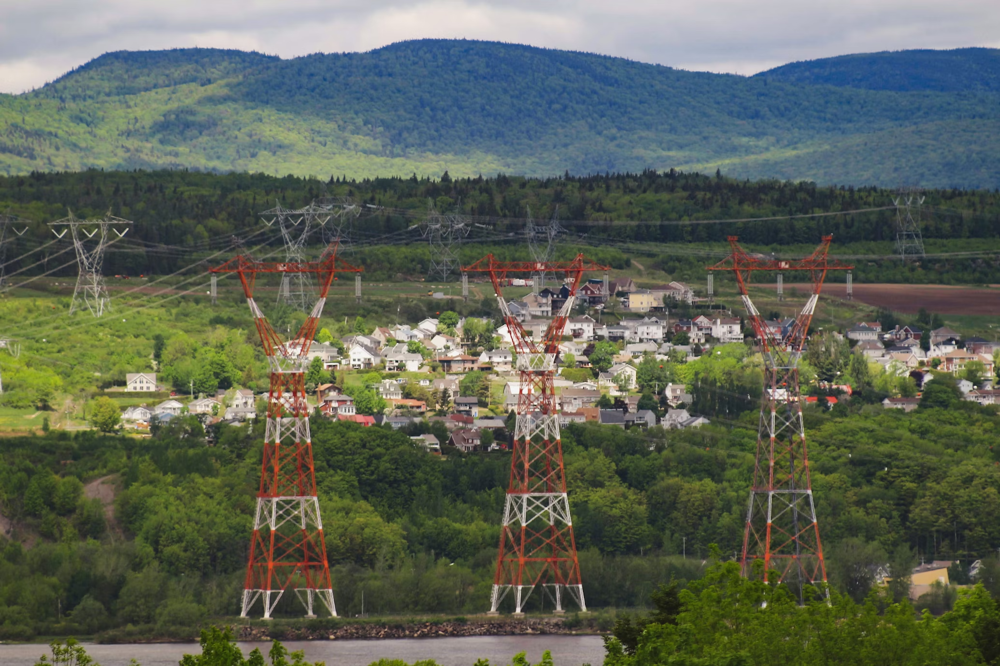

# 1. Business Understanding

# Overview

SyriaTel is a  telecommunication company which provides state of the art communication services. However, it is grappling with a challenge of customers churning. The business is facing revenue losses as a result of customers terminating their subscription. The primary goal of this project is to analyse the factors fueling customer churn and build a predictive model to identify patterns and indicators of the customers likely to churn soon. The target stakeholders are executives, product managers, marketing teams, finance and account teams, and contact centre team at Syria Tel. The data used can be accessed from [here](https://www.kaggle.com/datasets/becksddf/churn-in-telecoms-dataset).

# Business Problem

SyriaTel has noticed that customers are terminating their services, which has resulted in the company's loss of revenue and decreased market share. The stakeholders are afraid that this may eventually damage the company's brand. It is imperative to understand the factors driving the rate of customer churn before they can implement strategies to retain subscribers. The problem at hand is to develop a classifier model based on historical customer data to analyse churn patterns and predict the users at risk of unsubscribing. This will enable the company to implement various retention startegies, improve customer satisfaction, and eventually lessen the overall impact of turnover on its operations.

For this challenge, the project will explore various types of classification models like logistic regression, decision trees and random forests. These algorithms are ideal as we are predicting binary outcomes, that is, customer churn or no customer churn. 

# Project Objectives

1. To identify drivers of customer churn 
2. To develop binary classifiers to predict potential unsubscribers 
3. To provide actionable suggestions for retaining users

# 2. Data Understanding

We will use historical data from SyriaTel which contain information about customer call data obtained from [Kaggle]((https://www.kaggle.com/datasets/becksddf/churn-in-telecoms-dataset). The dataset has numerous features like user phone numbers, total calls, total call durations, state, customers churning e.t.c.distributed across 20 columns with 3333 records. 

Below are the columns in the SyriaTel customer dataset:
- state - Residence state of the cutomer
- account length - the number of days the customer has had an account	
- area code -	Area code of the customer
- phone number - Customer's registered phone number
- international plan -	Yes if the customer has an voicemail plan and no if not
- voice mail plan -	Yes if the customer has an internation plan and no if not
- number vmail messages -	number of customers vocemail messages
- total day minutes -	total minutes the customer was in call for during daytime
- total day calls -	total calls the customer made at daytime
- total day charge -	total amount the customer was charged by SyriaTel for calls made during the day
- total eve minutes -	total minutes the customer was in call for during the evening
- total eve calls -	total calls the customer made during the evening
- total eve charge -	total amount the customer was charged by SyriaTel for calls made during the evening
- total night minutes -	total minutes the customer was in call for at night
- total night calls -	total calls the customer made at night
- total night charge -	total amount the customer was charged by SyriaTel for calls made during at night
- total intl minutes -	total minutes the customer was in international calls
- total intl calls -	total international calls made by the customer
- total intl charge -	total amount the cutomer was charged by SyriaTel on international calls
- customer service calls -	total number of calls the customer made to SyriaTel customer service
- churn -	true if customer dicontinued services and false otherwise

In [58]:
# import the necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [59]:
# load the data
df = pd.read_csv('customerchurn.csv')
# check the first five rows
df.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [60]:
# check the last five rows
df.tail()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
3328,AZ,192,415,414-4276,no,yes,36,156.2,77,26.55,...,126,18.32,279.1,83,12.56,9.9,6,2.67,2,False
3329,WV,68,415,370-3271,no,no,0,231.1,57,39.29,...,55,13.04,191.3,123,8.61,9.6,4,2.59,3,False
3330,RI,28,510,328-8230,no,no,0,180.8,109,30.74,...,58,24.55,191.9,91,8.64,14.1,6,3.81,2,False
3331,CT,184,510,364-6381,yes,no,0,213.8,105,36.35,...,84,13.57,139.2,137,6.26,5.0,10,1.35,2,False
3332,TN,74,415,400-4344,no,yes,25,234.4,113,39.85,...,82,22.60,241.4,77,10.86,13.7,4,3.70,0,False


In [61]:
# check ten rowss at random
df.sample(10)

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
382,OR,149,415,332-9460,yes,no,0,176.2,87,29.95,...,81,12.33,249.5,92,11.23,5.7,4,1.54,0,False
1418,OH,29,415,397-3058,yes,yes,37,235.0,101,39.95,...,79,15.58,139.8,106,6.29,5.7,7,1.54,2,False
925,NC,43,415,334-7685,no,no,0,84.2,134,14.31,...,103,6.87,196.1,79,8.82,10.8,2,2.92,1,False
2403,WV,21,415,332-5582,no,no,0,91.9,109,15.62,...,111,16.86,171.7,125,7.73,13.0,7,3.51,2,False
3005,OH,66,415,408-6305,no,no,0,170.5,103,28.99,...,77,21.62,197.3,138,8.88,10.5,2,2.84,2,False
1858,DE,133,510,333-2906,no,no,0,245.8,102,41.79,...,90,22.50,111.7,103,5.03,11.2,7,3.02,0,False
1666,KY,88,415,405-8075,no,no,0,148.2,82,25.19,...,67,26.24,235.4,79,10.59,6.4,4,1.73,2,False
580,IN,113,415,353-6007,no,no,0,209.4,151,35.60,...,113,29.52,246.0,116,11.07,7.4,2,2.00,1,True
2481,VA,80,415,383-9355,no,no,0,197.5,114,33.58,...,119,17.59,163.6,109,7.36,11.3,4,3.05,1,False
1231,CO,105,408,334-8694,no,no,0,270.9,98,46.05,...,110,19.23,178.8,60,8.05,8.8,5,2.38,0,True


In [62]:
# Check data types and column information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   phone number            3333 non-null   object 
 4   international plan      3333 non-null   object 
 5   voice mail plan         3333 non-null   object 
 6   number vmail messages   3333 non-null   int64  
 7   total day minutes       3333 non-null   float64
 8   total day calls         3333 non-null   int64  
 9   total day charge        3333 non-null   float64
 10  total eve minutes       3333 non-null   float64
 11  total eve calls         3333 non-null   int64  
 12  total eve charge        3333 non-null   float64
 13  total night minutes     3333 non-null   float64
 14  total night calls       3333 non-null   

In [63]:
# Check the statistical summary of the data
df.describe()

,account length,area code,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,42.371290,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [64]:
df.corr()

,account length,area code,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
account length,1.000000,-0.012463,-0.004628,0.006216,0.038470,0.006214,-0.006757,0.019260,-0.006745,-0.008955,-0.013176,-0.008960,0.009514,0.020661,0.009546,-0.003796,0.016541
area code,-0.012463,1.000000,-0.001994,-0.008264,-0.009646,-0.008264,0.003580,-0.011886,0.003607,-0.005825,0.016522,-0.005845,-0.018288,-0.024179,-0.018395,0.027572,0.006174
number vmail messages,-0.004628,-0.001994,1.000000,0.000778,-0.009548,0.000776,0.017562,-0.005864,0.017578,0.007681,0.007123,0.007663,0.002856,0.013957,0.002884,-0.013263,-0.089728
total day minutes,0.006216,-0.008264,0.000778,1.000000,0.006750,1.000000,0.007043,0.015769,0.007029,0.004323,0.022972,0.004300,-0.010155,0.008033,-0.010092,-0.013423,0.205151
total day calls,0.038470,-0.009646,-0.009548,0.006750,1.000000,0.006753,-0.021451,0.006462,-0.021449,0.022938,-0.019557,0.022927,0.021565,0.004574,0.021666,-0.018942,0.018459
total day charge,0.006214,-0.008264,0.000776,1.000000,0.006753,1.000000,0.007050,0.015769,0.007036,0.004324,0.022972,0.004301,-0.010157,0.008032,-0.010094,-0.013427,0.205151
total eve minutes,-0.006757,0.003580,0.017562,0.007043,-0.021451,0.007050,1.000000,-0.011430,1.000000,-0.012584,0.007586,-0.012593,-0.011035,0.002541,-0.011067,-0.012985,0.092796
total eve calls,0.019260,-0.011886,-0.005864,0.015769,0.006462,0.015769,-0.011430,1.000000,-0.011423,-0.002093,0.007710,-0.002056,0.008703,0.017434,0.008674,0.002423,0.009233
total eve charge,-0.006745,0.003607,0.017578,0.007029,-0.021449,0.007036,1.000000,-0.011423,1.000000,-0.012592,0.007596,-0.012601,-0.011043,0.002541,-0.011074,-0.012987,0.092786
total night minutes,-0.008955,-0.005825,0.007681,0.004323,0.022938,0.004324,-0.012584,-0.002093,-0.012592,1.000000,0.011204,0.999999,-0.015207,-0.012353,-0.015180,-0.009288,0.035493


In [65]:
# Check the shape of the data
df.shape

(3333, 21)

## Investigate Unique Values in Each Column

Investigate unique values in the columns to find any uncaught null values or incorrect data types

In [66]:
df['state'].value_counts()

WV    106
MN     84
NY     83
AL     80
OH     78
WI     78
OR     78
WY     77
VA     77
CT     74
ID     73
VT     73
MI     73
TX     72
UT     72
IN     71
MD     70
KS     70
MT     68
NC     68
NJ     68
CO     66
NV     66
WA     66
MS     65
RI     65
MA     65
AZ     64
MO     63
FL     63
NM     62
ND     62
ME     62
OK     61
NE     61
DE     61
SC     60
SD     60
KY     59
IL     58
NH     56
AR     55
DC     54
GA     54
TN     53
HI     53
AK     52
LA     51
PA     45
IA     44
CA     34
Name: state, dtype: int64

In [67]:
df['account length'].value_counts()

105    43
87     42
93     40
101    40
90     39
       ..
191     1
199     1
215     1
221     1
2       1
Name: account length, Length: 212, dtype: int64

In [68]:
df['area code'].value_counts()

415    1655
510     840
408     838
Name: area code, dtype: int64

In [69]:
df['phone number'].value_counts()

409-4791    1
386-9981    1
417-6044    1
384-2219    1
341-4075    1
           ..
353-3285    1
400-6999    1
403-2455    1
398-2628    1
385-3111    1
Name: phone number, Length: 3333, dtype: int64

In [70]:
df['international plan'].value_counts()

no     3010
yes     323
Name: international plan, dtype: int64

In [71]:
df['voice mail plan'].value_counts()

no     2411
yes     922
Name: voice mail plan, dtype: int64

In [72]:
df['number vmail messages'].value_counts()

0     2411
31      60
29      53
28      51
33      46
27      44
30      44
24      42
26      41
32      41
25      37
23      36
36      34
35      32
22      32
39      30
37      29
34      29
21      28
38      25
20      22
19      19
40      16
42      15
17      14
41      13
16      13
43       9
15       9
18       7
44       7
14       7
45       6
12       6
46       4
13       4
47       3
8        2
48       2
50       2
9        2
11       2
49       1
10       1
4        1
51       1
Name: number vmail messages, dtype: int64

In [73]:
df['total day minutes'].value_counts()

174.5    8
159.5    8
154.0    8
175.4    7
162.3    7
        ..
199.9    1
105.8    1
125.6    1
179.8    1
270.8    1
Name: total day minutes, Length: 1667, dtype: int64

In [74]:
df['total day calls'].value_counts()

102    78
105    75
107    69
95     69
104    68
       ..
149     1
157     1
36      1
30      1
165     1
Name: total day calls, Length: 119, dtype: int64

In [75]:
df['total day charge'].value_counts()

27.12    8
26.18    8
29.67    8
31.18    7
27.59    7
        ..
19.36    1
16.95    1
34.12    1
48.35    1
13.28    1
Name: total day charge, Length: 1667, dtype: int64

In [76]:
df['total eve minutes'].value_counts()

169.9    9
230.9    7
209.4    7
201.0    7
220.6    7
        ..
335.0    1
258.9    1
134.7    1
318.8    1
317.2    1
Name: total eve minutes, Length: 1611, dtype: int64

In [77]:
df['total eve calls'].value_counts()

105    80
94     79
108    71
97     70
102    70
       ..
45      1
49      1
145     1
153     1
0       1
Name: total eve calls, Length: 123, dtype: int64

In [78]:
df['total eve charge'].value_counts()

14.25    11
16.12    11
15.90    10
18.62     9
14.44     9
         ..
12.64     1
13.83     1
11.39     1
28.03     1
20.53     1
Name: total eve charge, Length: 1440, dtype: int64

In [79]:
df['total eve minutes'].value_counts()

169.9    9
230.9    7
209.4    7
201.0    7
220.6    7
        ..
335.0    1
258.9    1
134.7    1
318.8    1
317.2    1
Name: total eve minutes, Length: 1611, dtype: int64

In [80]:
df['total eve calls'].value_counts()

105    80
94     79
108    71
97     70
102    70
       ..
45      1
49      1
145     1
153     1
0       1
Name: total eve calls, Length: 123, dtype: int64

In [81]:
df['total eve charge'].value_counts()

14.25    11
16.12    11
15.90    10
18.62     9
14.44     9
         ..
12.64     1
13.83     1
11.39     1
28.03     1
20.53     1
Name: total eve charge, Length: 1440, dtype: int64

In [82]:

df['total night minutes'].value_counts()

210.0    8
214.6    8
197.4    8
191.4    8
188.2    8
        ..
132.3    1
306.2    1
293.5    1
271.7    1
182.6    1
Name: total night minutes, Length: 1591, dtype: int64

In [83]:
df['total night calls'].value_counts()

105    84
104    78
91     76
102    72
100    69
       ..
164     1
166     1
33      1
149     1
36      1
Name: total night calls, Length: 120, dtype: int64

In [84]:
df['total night charge'].value_counts()

9.66     15
9.45     15
8.88     14
8.47     14
7.69     13
         ..
14.65     1
6.46      1
3.94      1
15.74     1
6.14      1
Name: total night charge, Length: 933, dtype: int64

In [85]:
df['total intl minutes'].value_counts()

10.0    62
11.3    59
9.8     56
10.9    56
10.1    53
        ..
18.9     1
1.3      1
2.7      1
2.6      1
3.1      1
Name: total intl minutes, Length: 162, dtype: int64

In [86]:
df['total intl calls'].value_counts()

3     668
4     619
2     489
5     472
6     336
7     218
1     160
8     116
9     109
10     50
11     28
0      18
12     15
13     14
15      7
14      6
18      3
16      2
19      1
17      1
20      1
Name: total intl calls, dtype: int64

In [87]:
df['total intl charge'].value_counts()

2.70    62
3.05    59
2.65    56
2.94    56
2.73    53
        ..
0.68     1
4.83     1
0.84     1
0.30     1
5.40     1
Name: total intl charge, Length: 162, dtype: int64

In [88]:
df['customer service calls'].value_counts()

1    1181
2     759
0     697
3     429
4     166
5      66
6      22
7       9
9       2
8       2
Name: customer service calls, dtype: int64

In [89]:
df['churn'].value_counts()

False    2850
True      483
Name: churn, dtype: int64

# 3. Data Preparation

In this section, we will prepare our data for modelling. We will check our data for and handle:
- Duplicate rows
- Missing values
- Conversion of categorical data to numeric
- Multicollinearity

In [90]:
# check if there are any duplicates
df.duplicated().sum()

0

In [91]:
# Find and count null entries
df.isna().sum()

state                     0
account length            0
area code                 0
phone number              0
international plan        0
voice mail plan           0
number vmail messages     0
total day minutes         0
total day calls           0
total day charge          0
total eve minutes         0
total eve calls           0
total eve charge          0
total night minutes       0
total night calls         0
total night charge        0
total intl minutes        0
total intl calls          0
total intl charge         0
customer service calls    0
churn                     0
dtype: int64

In [92]:
# The data set has no missing values

In [93]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   phone number            3333 non-null   object 
 4   international plan      3333 non-null   object 
 5   voice mail plan         3333 non-null   object 
 6   number vmail messages   3333 non-null   int64  
 7   total day minutes       3333 non-null   float64
 8   total day calls         3333 non-null   int64  
 9   total day charge        3333 non-null   float64
 10  total eve minutes       3333 non-null   float64
 11  total eve calls         3333 non-null   int64  
 12  total eve charge        3333 non-null   float64
 13  total night minutes     3333 non-null   float64
 14  total night calls       3333 non-null   

## Dropping Unnecessary Columns


In [94]:
df = df.drop("phone number", axis=1)

## Converting Categorical Variables

In [95]:
# Converting categorical variables to numeric using One-Hot Encoding
df = pd.get_dummies(df, columns=["voice mail plan", "international plan"], drop_first=True)

## Converting the Boolean to Numeric

In [96]:
# converting Churn to numeric format where 1 is True and 0 is False
df["churn"] = df['churn'].astype(int)

In [97]:
# check that everything is in order
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   number vmail messages   3333 non-null   int64  
 4   total day minutes       3333 non-null   float64
 5   total day calls         3333 non-null   int64  
 6   total day charge        3333 non-null   float64
 7   total eve minutes       3333 non-null   float64
 8   total eve calls         3333 non-null   int64  
 9   total eve charge        3333 non-null   float64
 10  total night minutes     3333 non-null   float64
 11  total night calls       3333 non-null   int64  
 12  total night charge      3333 non-null   float64
 13  total intl minutes      3333 non-null   float64
 14  total intl calls        3333 non-null   

In [98]:
df.head()

,state,account length,area code,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn,voice mail plan_yes,international plan_yes
0,KS,128,415,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0,1,0
1,OH,107,415,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0,1,0
2,NJ,137,415,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0,0,0
3,OH,84,408,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0,0,1
4,OK,75,415,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0,0,1


## Explanatory Data Analysis

Here, we will conduct explanatory data analysis to explore and understand the features. We will apply descriptive statistics and visualizations to identify the main patterns of the data and discover any relationships between the features and the target variable "churn".

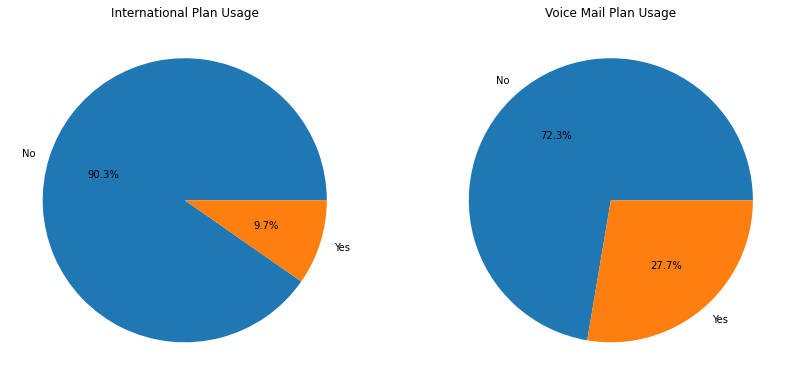

In [99]:
# Assuming df is your DataFrame
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

# Pie chart for 'international plan'
y_international_plan = df['international plan_yes'].value_counts()
axes[0].pie(y_international_plan, labels=['No', 'Yes'], autopct='%1.1f%%')
axes[0].set_title('International Plan Usage')

# Pie chart for 'voice mail plan'
y_voice_mail_plan = df['voice mail plan_yes'].value_counts()
axes[1].pie(y_voice_mail_plan, labels=['No', 'Yes'], autopct='%1.1f%%')
axes[1].set_title('Voice Mail Plan Usage')

plt.show()

9.7% of the customers do use the international plans while 27.7% use the voice mail plan

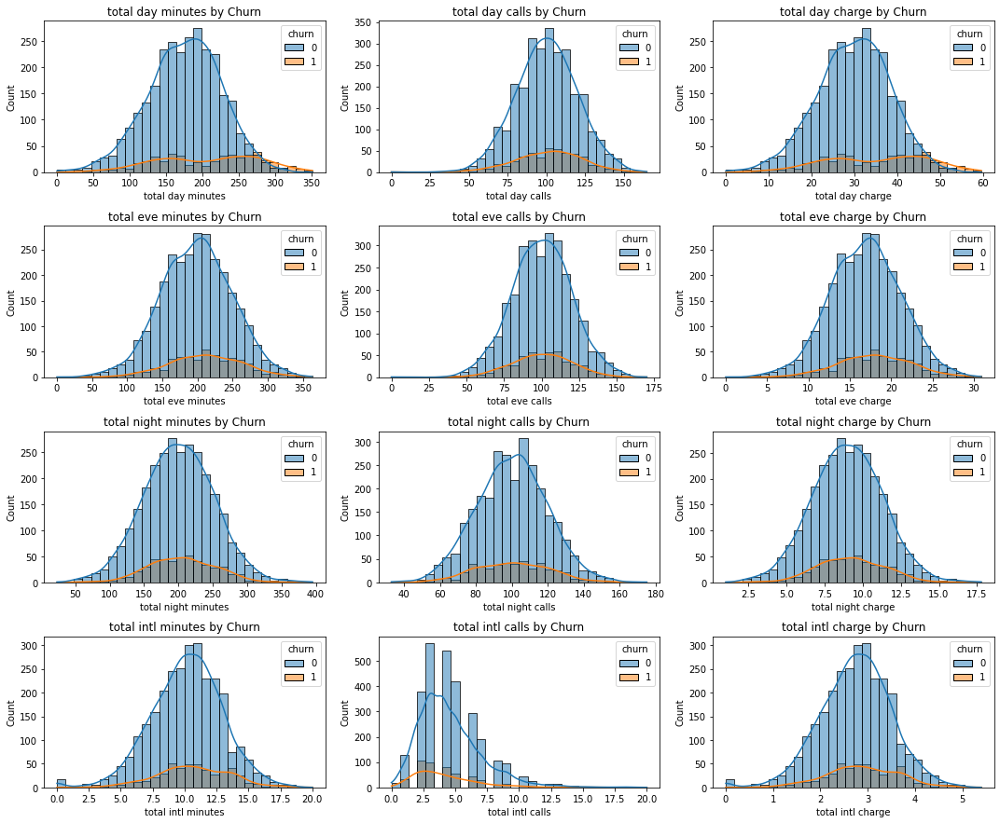

In [100]:
# Relationship Between Call Charge Time and Churn

plt.figure(figsize=(15, 15))

# List of numerical features
call_charge_time = [ 'total day minutes', 'total day calls',
                      'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge',
                      'total night minutes', 'total night calls', 'total night charge', 'total intl minutes',
                      'total intl calls', 'total intl charge']

# Plot histograms for each numerical feature against the 'churn' variable
for i, feature in enumerate(call_charge_time, 1):
    plt.subplot(5, 3, i)
    sns.histplot(data=df, x=feature, hue='churn', bins=30, kde=True)
    plt.title(f'{feature} by Churn')

plt.tight_layout()
plt.show()

All the call charge time have a normal distribution apart from the International Calls

In [101]:
#Defining numeric features from the data set
numerical_features = ['account length', 'number vmail messages', 'total day minutes', 'total day calls',
                      'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge',
                      'total night minutes', 'total night calls', 'total night charge', 'total intl minutes',
                      'total intl calls', 'total intl charge', 'customer service calls']
#defining categorical features from the data set
categorical_features = ['state', 'area code', 'international plan', 'voice mail plan']

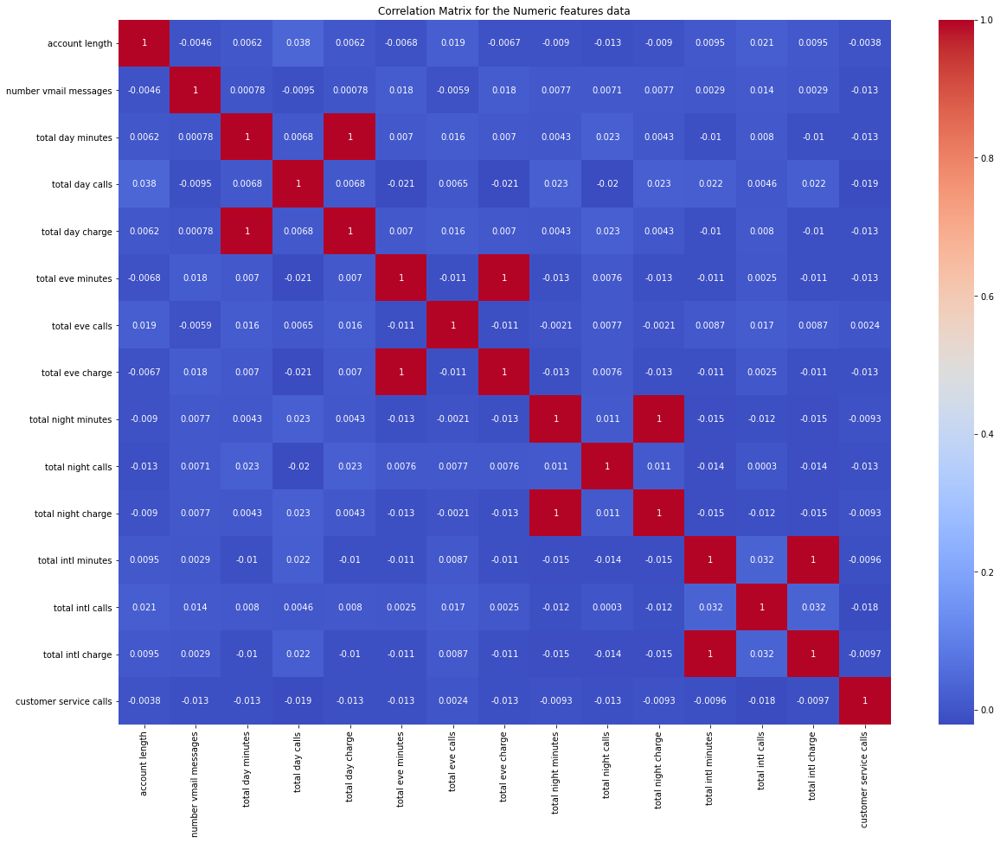

In [102]:
plt.figure(figsize=(20, 15))
sns.heatmap(df[numerical_features].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix for the Numeric features data')
plt.show()

In [103]:
# checking for multicolinearity

corr = df[numerical_features].corr().abs()

Multicollinear_Features = []
Multicollinear_Corr = []

# Function to check multicollinearity for a given feature
def check_multicollinearity(feature):
    for idx, correlation in corr[feature].items():
        if correlation >= 0.75 and idx != feature:
            Multicollinear_Features.append([feature, idx])
            Multicollinear_Corr.append(correlation)

# Iterate over features in the correlation matrix
for feature in corr.columns:
    check_multicollinearity(feature)

# Creating a DataFrame with multicollinearity information
MC_df = pd.DataFrame({'Correlations': Multicollinear_Corr, 'Features': Multicollinear_Features})
MC_df = MC_df.sort_values(by='Correlations', ascending=False)


print(MC_df)

   Correlations                                   Features
0      1.000000      [total day minutes, total day charge]
1      1.000000      [total day charge, total day minutes]
2      1.000000      [total eve minutes, total eve charge]
3      1.000000      [total eve charge, total eve minutes]
4      0.999999  [total night minutes, total night charge]
5      0.999999  [total night charge, total night minutes]
6      0.999993    [total intl minutes, total intl charge]
7      0.999993    [total intl charge, total intl minutes]


- total day minutes & total day charge
- total day charge & total day minutes
- total eve minutes & total eve charge
- total eve charge & total eve minutes

Have a high correlation

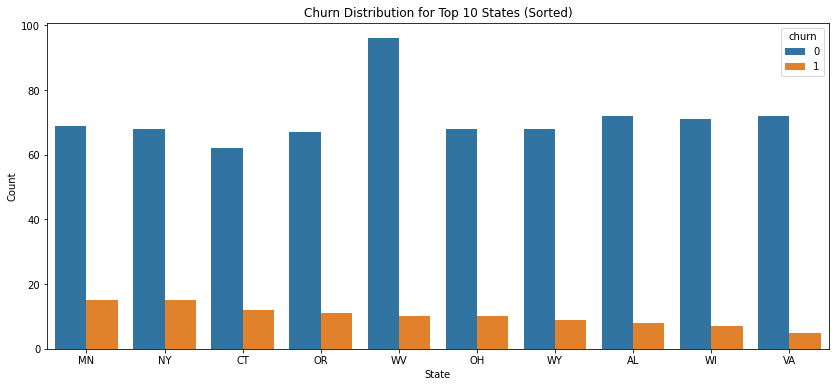

In [104]:
# Churn distribution based on the top 10 states
# Identifying the top 10 states based on churn counts and sorting them
top_states = df['state'].value_counts().nlargest(10).index

# Sort the top states in descending order based on churn counts
top_states = sorted(top_states, key=lambda state: df[df['state'] == state]['churn'].sum(), reverse=True)

# Filter the DataFrame for the top 10 states
df_top_states = df[df['state'].isin(top_states)]

# Plot the countplot for the top 10 states
plt.figure(figsize=(14, 6))
sns.countplot(x='state', hue='churn', data=df_top_states, order=top_states)
plt.title('Churn Distribution for Top 10 States (Sorted)')
plt.xlabel('State')
plt.ylabel('Count')
plt.show()


The states with the highest churn rates include MN, NY, CT. However, there isn't a definitive explanation for why certain states outperform others in this regard, prompting a shift to analyzing regions instead.

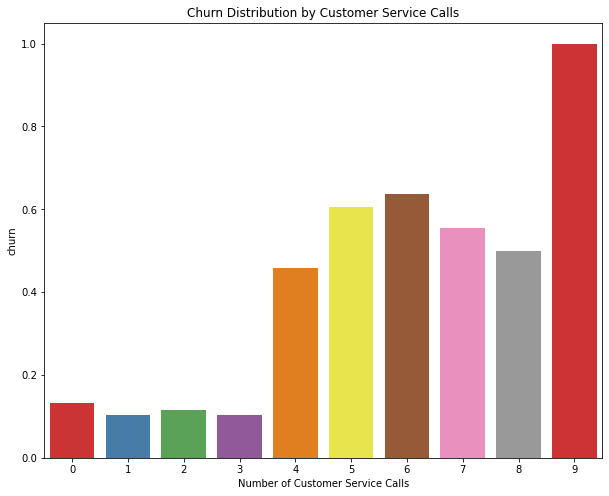

In [105]:
# churn distribution based on the customer service calls
plt.figure(figsize=(10, 8))
sns.barplot(x='customer service calls', y='churn', data=df, palette='Set1', ci=None)
plt.title('Churn Distribution by Customer Service Calls')
plt.xlabel('Number of Customer Service Calls')
plt.show()


As the number of customer service calls increases, the likelihood of churning also increases.
Above 4 calls, the churn rate increases.

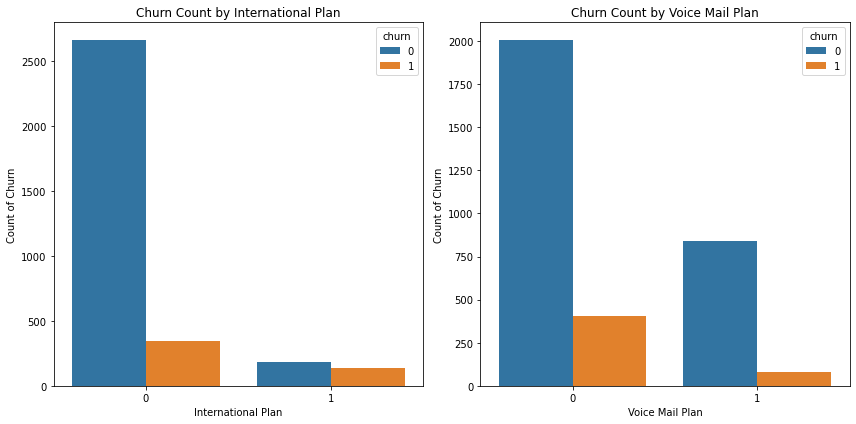

In [106]:
# churn count by international plan and voice mail plan
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot Churn Count by International Plan
sns.countplot(x='international plan_yes', data=df, hue='churn', ax=axes[0])
axes[0].set_xlabel('International Plan')
axes[0].set_ylabel('Count of Churn')
axes[0].set_title('Churn Count by International Plan')

# Plot Churn Count by Voice Mail Plan
sns.countplot(x='voice mail plan_yes', data=df, hue='churn', ax=axes[1])
axes[1].set_xlabel('Voice Mail Plan')
axes[1].set_ylabel('Count of Churn')
axes[1].set_title('Churn Count by Voice Mail Plan')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

People who do not have an international plan and a voice mail plane have a higher churn rate

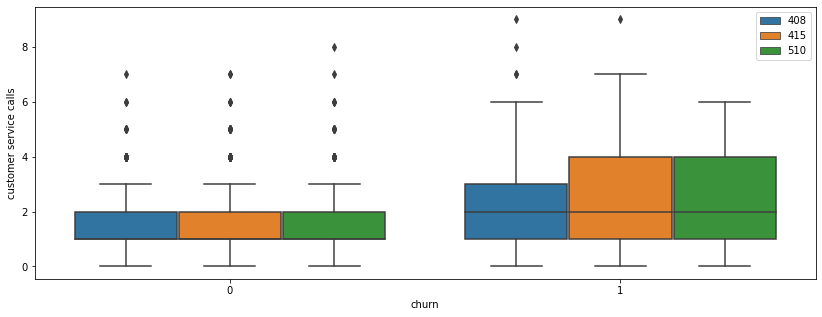

In [107]:
# churn rate based on the customer service calls and the area codes
plt.figure(figsize=(14,5))
sns.boxplot(data=df,x='churn',y='customer service calls',hue='area code');
plt.legend(loc='upper right');

Area Code 415 & 510 have a high customer service calls which in turn have a high churn rate

In [108]:
# Average cost per minute 
cost_per_minute_day = df['total day charge'] / df['total day minutes']
cost_per_minute_evening = df['total eve charge'] / df['total eve minutes']
cost_per_minute_night = df['total night charge'] / df['total night minutes']
cost_per_minute_international = df['total intl charge'] / df['total intl minutes']

average_cost_day = cost_per_minute_day.mean()
average_cost_evening = cost_per_minute_evening.mean()
average_cost_night = cost_per_minute_night.mean()
average_cost_international = cost_per_minute_international.mean()


print(f'Average Cost per Minute (Day): {average_cost_day:.2f}')
print(f'Average Cost per Minute (Evening): {average_cost_evening:.2f}')
print(f'Average Cost per Minute (Night): {average_cost_night:.2f}')
print(f'Average Cost per Minute (International): {average_cost_international:.2f}')

Average Cost per Minute (Day): 0.17
Average Cost per Minute (Evening): 0.09
Average Cost per Minute (Night): 0.05
Average Cost per Minute (International): 0.27


The averages for making the calls per minute ranges from 0.05(Night time) to 0.27(International Calls)

# 4. Modeling

## i) Logistic Regression Model

In [109]:
#import necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

### All features except State
###### **Model One**

In [110]:
X= df.drop(columns=["state","churn"], axis =1 )
y = df["churn"]

# train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42 )

#Standerdize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Instantiate the model
logreg = LogisticRegression(fit_intercept=False, C=1e12, solver='liblinear', random_state=42)

# fit the model
model_log = logreg.fit(X_train_scaled, y_train)

# predict the model
y_hat_train = logreg.predict(X_train_scaled)
y_hat_test = logreg.predict(X_test_scaled)

In [111]:
# Get the precision score, recall score, accuracy score and F1 score for both the training and testing sets
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score

print('Training Precision: ', precision_score(y_train, y_hat_train))
print('Testing Precision: ', precision_score(y_test, y_hat_test))
print('\n\n')
print('Training Recall: ', recall_score(y_train, y_hat_train))
print('Testing Recall: ', recall_score(y_test, y_hat_test))
print('\n\n')
print('Training Accuracy: ', accuracy_score(y_train, y_hat_train))
print('Testing Accuracy: ', accuracy_score(y_test, y_hat_test))
print('\n\n')
print('Training F1-Score: ', f1_score(y_train, y_hat_train))
print('Testing F1-Score: ', f1_score(y_test, y_hat_test))


# Additional: Confusion Matrix
# Import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix
conf_matrix = confusion_matrix(y_test, y_hat_test)
print("\nConfusion Matrix:\n", conf_matrix)

Training Precision:  0.2896613190730838
Testing Precision:  0.3079584775086505



Training Recall:  0.8507853403141361
Testing Recall:  0.8811881188118812



Training Accuracy:  0.6796699174793699
Testing Accuracy:  0.6821589205397302



Training F1-Score:  0.43218085106382986
Testing F1-Score:  0.4564102564102564

Confusion Matrix:
 [[366 200]
 [ 12  89]]


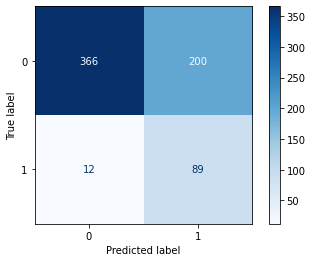

In [112]:
# Print confusion matrix
cnf_matrix = confusion_matrix(y_test, y_hat_test)

disp = ConfusionMatrixDisplay(confusion_matrix=cnf_matrix, display_labels=model_log.classes_)
disp.plot(cmap=plt.cm.Blues)

In [113]:
from sklearn.metrics import roc_curve, auc

#calculate the probability scores 
y_score = logreg.fit(X_train_scaled, y_train).decision_function(X_test_scaled)

fpr, tpr, thresholds = roc_curve(y_test, y_score)

print('AUC: {}'.format(auc(fpr, tpr)))

AUC: 0.8234090193471644


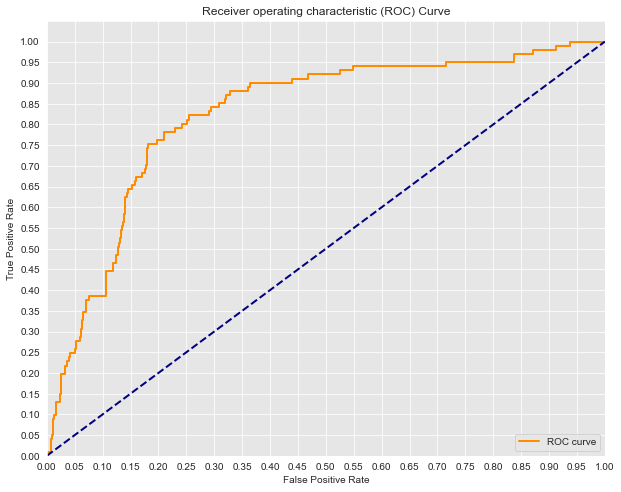

In [114]:
sns.set_style('darkgrid', {'axes.facecolor': '0.9'})


plt.figure(figsize=(10, 8))
lw = 2
logreg_fpr1 = fpr
logreg_tpr1 = tpr
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [115]:
# In order to deal with the class imbalance- Use SMOTE Method

In [116]:
from imblearn.over_sampling import SMOTE

# Previous original class distribution
print('Original class distribution: \n')
print(y.value_counts())
smote = SMOTE()
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train) 
# Preview synthetic sample class distribution
print('-----------------------------------------')
print('Synthetic sample class distribution: \n')
print(pd.Series(y_train_resampled).value_counts()) 

Original class distribution: 

0    2850
1     483
Name: churn, dtype: int64
-----------------------------------------
Synthetic sample class distribution: 

1    2284
0    2284
Name: churn, dtype: int64


###### **Model 2- Resampled**

In [119]:
sm = SMOTE()
X_train_resampled, y_train_resampled = sm.fit_resample(X_train_scaled, y_train)

# Check the counts of the resampled target variable
print(pd.Series(y_train_resampled).value_counts())

# creates an instance of the logistic regression model after balancing
model_log_resampled = LogisticRegression(fit_intercept=False, C=1e12, solver='liblinear', random_state=42)

# training the model after balancing the training set
resampled_fit = model_log_resampled.fit(X_train_resampled, y_train_resampled)

# make predictions on the balanced training set
y_hat_train_resampled = model_log_resampled.predict(X_train_resampled)

train_residuals_resampled = np.abs(y_train_resampled - y_hat_train_resampled)

1    2284
0    2284
Name: churn, dtype: int64


In [120]:
from imblearn.over_sampling import SMOTE

# Convert to NumPy arrays without feature names
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# Apply SMOTE to the train set
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train)

# Instantiate the model
logreg = LogisticRegression(fit_intercept=False, C=1e12, solver='liblinear', random_state=42)

# fit the model
model_log = logreg.fit(X_train_resampled, y_train_resampled)

# Predict on the resampled train & test set 
y_hat_train_resampled = logreg.predict(X_train_resampled)
y_hat_test_resampled = logreg.predict(X_test_scaled)

# Calculate precision, accuracy, recall, and F1 score
print('Training Precision: ', precision_score(y_train_resampled, y_hat_train_resampled))
print('Testing Precision: ', precision_score(y_test, y_hat_test_resampled))
print('\n\n')
print('Training Recall: ', recall_score(y_train_resampled, y_hat_train_resampled))
print('Testing Recall: ', recall_score(y_test, y_hat_test_resampled))
print('\n\n')
print('Training Accuracy: ', accuracy_score(y_train_resampled, y_hat_train_resampled))
print('Testing Accuracy: ', accuracy_score(y_test, y_hat_test_resampled))
print('\n\n')
print('Training F1-Score: ', f1_score(y_train_resampled, y_hat_train_resampled))
print('Testing F1-Score: ', f1_score(y_test, y_hat_test_resampled))


from sklearn.metrics import confusion_matrix
print('\n\n')
# confusion matrix for training set
conf_matrix_resampled = confusion_matrix(y_train_resampled, y_hat_train_resampled)
print("Confusion Matrix for training set (after SMOTE):\n", conf_matrix_resampled)
print('\n\n')
# confusion matrix for testing set
conf_matrix_resampled = confusion_matrix(y_test, y_hat_test_resampled)
print("Confusion Matrix for testing set (after SMOTE):\n", conf_matrix_resampled)


Training Precision:  0.6987993138936535
Testing Precision:  0.30132450331125826



Training Recall:  0.8918563922942206
Testing Recall:  0.900990099009901



Training Accuracy:  0.7537215411558669
Testing Accuracy:  0.6686656671664168



Training F1-Score:  0.7836122331217541
Testing F1-Score:  0.4516129032258065



Confusion Matrix for training set (after SMOTE):
 [[1406  878]
 [ 247 2037]]



Confusion Matrix for testing set (after SMOTE):
 [[355 211]
 [ 10  91]]


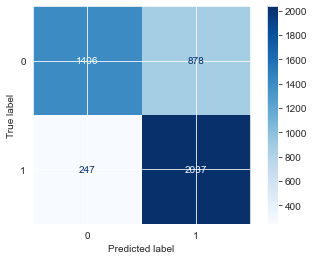

In [121]:
# Print confusion matrix for training set
cnf_matrix = confusion_matrix(y_train_resampled, y_hat_train_resampled)

disp = ConfusionMatrixDisplay(confusion_matrix=cnf_matrix, display_labels=model_log.classes_)
disp.plot(cmap=plt.cm.Blues)

LogisticRegression(C=1000000000000.0, fit_intercept=False, random_state=42,
                   solver='liblinear')
AUC: 0.8332225448693279


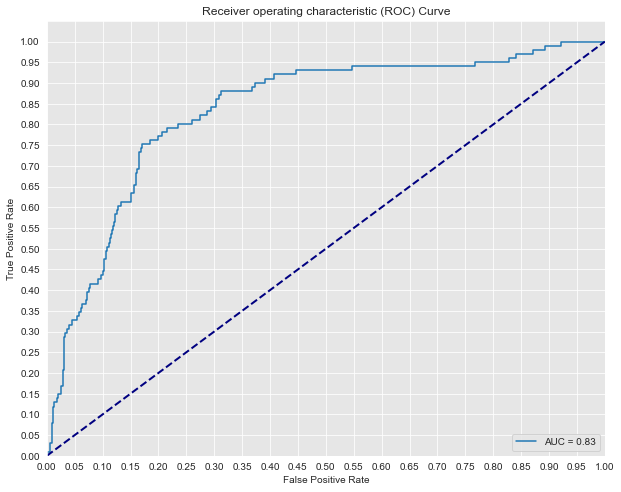

In [122]:
# Fit a model
smote = SMOTE()
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train) 
logreg = LogisticRegression(fit_intercept=False, C=1e12, solver ='liblinear', random_state=42)
model_log = logreg.fit(X_train_resampled, y_train_resampled)
print(model_log)

# Predict
y_hat_test = logreg.predict(X_test_scaled)

y_score = logreg.decision_function(X_test_scaled)

fpr, tpr, thresholds = roc_curve(y_test, y_score)

sns.set_style('darkgrid', {'axes.facecolor': '0.9'})

print('AUC: {}'.format(auc(fpr, tpr)))
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(10, 8))
plt.plot(fpr, tpr, label='AUC = {:.2f}'.format(roc_auc))
lw = 2

logreg_fpr1_resampled = fpr
logreg_tpr1_resampled = tpr

plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


- Precision for the training dataset has increased significantly after SMOTE, indicating fewer false positives. However, there's a slight decreased in the precision for the testing dataset.

- Recall for both the training and testing datasets has increased after SMOTE, indicating better identification of positive cases.

- Accuracy for the training dataset has increased, but the accuracy for the testing dataset has slightly decreased  after SMOTE.

- F1-score for both the training and testing datasets has increased after SMOTE, indicating a better balance between precision and recall.

In summary, balancing the data using SMOTE has positively impacted the model's ability to correctly classify instances of the minority class, leading to improvements in precision, recall, and overall model performance.

### **Dropping Irrelevant columns**

In [123]:
X= df.drop(['area code', 'state','account length','total day charge','total eve charge', 'total night charge', 'total intl charge', 'churn'], axis =1)
y = df['churn']

# train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42 )

#Standerdize the features
scale = StandardScaler()
X_train_scaled = scale.fit_transform(X_train)
X_test_scaled = scale.transform(X_test)

# Instantiate the mode
logreg = LogisticRegression(fit_intercept=False, C=1e12, solver='liblinear', random_state=42)

# fit the model
model_log = logreg.fit(X_train_scaled, y_train)          

In [124]:
X.columns

Index(['number vmail messages', 'total day minutes', 'total day calls',
       'total eve minutes', 'total eve calls', 'total night minutes',
       'total night calls', 'total intl minutes', 'total intl calls',
       'customer service calls', 'voice mail plan_yes',
       'international plan_yes'],
      dtype='object')

In [127]:
y_hat_train = logreg.predict(X_train_scaled)
y_hat_test = logreg.predict(X_test_scaled)

# calculating the metrics

print('Training Precision: ', precision_score(y_train, y_hat_train))
print('Testing Precision: ', precision_score(y_test, y_hat_test))
print('\n\n')

print('Training Recall: ', recall_score(y_train, y_hat_train))
print('Testing Recall: ', recall_score(y_test, y_hat_test))
print('\n\n')

print('Training Accuracy: ', accuracy_score(y_train, y_hat_train))
print('Testing Accuracy: ', accuracy_score(y_test, y_hat_test))
print('\n\n')

print('Training F1-Score: ', f1_score(y_train, y_hat_train))
print('Testing F1-Score: ', f1_score(y_test, y_hat_test))

# Additional: Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_hat_test)
print("\nConfusion Matrix:\n", conf_matrix)

Training Precision:  0.2867256637168142
Testing Precision:  0.30847457627118646



Training Recall:  0.8481675392670157
Testing Recall:  0.900990099009901



Training Accuracy:  0.6759189797449362
Testing Accuracy:  0.679160419790105



Training F1-Score:  0.4285714285714286
Testing F1-Score:  0.4595959595959596

Confusion Matrix:
 [[362 204]
 [ 10  91]]


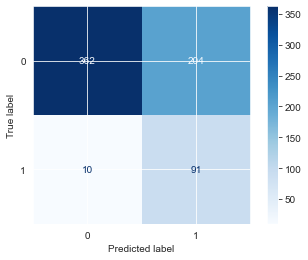

In [128]:
# Print confusion matrix
cnf_matrix = confusion_matrix(y_test, y_hat_test)

disp = ConfusionMatrixDisplay(confusion_matrix=cnf_matrix, display_labels=model_log.classes_)
disp.plot(cmap=plt.cm.Blues)

In [129]:
#calculate the probability scores of each of the datapoints:
y_score = logreg.fit(X_train_scaled, y_train).decision_function(X_test_scaled)

fpr, tpr, thresholds = roc_curve(y_test, y_score)

print('AUC: {}'.format(auc(fpr, tpr)))

AUC: 0.8271000244900816


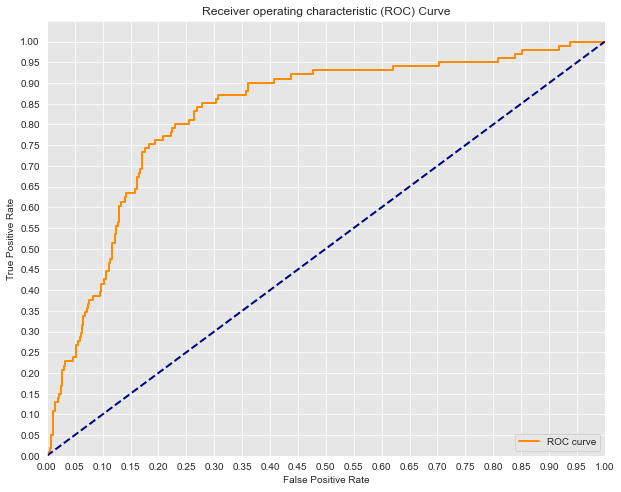

In [130]:
sns.set_style('darkgrid', {'axes.facecolor': '0.9'})

# plotting the ROC curve
plt.figure(figsize=(10, 8))
lw = 2

logreg_fpr2= fpr
logreg_tpr2 = tpr
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [131]:
# performing SMOTE

# Previous original class distribution
print('Original class distribution: \n')
print(y.value_counts())
smote = SMOTE()
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train) 
# Preview synthetic sample class distribution
print('-----------------------------------------')
print('Synthetic sample class distribution: \n')
print(pd.Series(y_train_resampled).value_counts()) 

Original class distribution: 

0    2850
1     483
Name: churn, dtype: int64
-----------------------------------------
Synthetic sample class distribution: 

1    2284
0    2284
Name: churn, dtype: int64


In [40]:
sm = SMOTE()
X_train_resampled, y_train_resampled = sm.fit_resample()

# Check the counts of the resampled target variable
print(pd.Series(y_train_resampled).value_counts())

# creates an instance of the logistic regression model after balancing
model_log_resampled = LogisticRegression(fit_intercept=False, C=1e12, solver='liblinear', random_state=42)

# training the model after balancing the training set
resampled_fit = model_log_resampled.fit(X_train_resampled, y_train_resampled)

# make predictions on the balanced training set
y_hat_train_resampled = model_log_resampled.predict(X_train_resampled)

train_residuals_resampled = np.abs(y_train_resampled - y_hat_train_resampled)



from imblearn.over_sampling import SMOTE

# Apply SMOTE to the test set
smote = SMOTE(random_state=42)
X_test_resampled, y_test_resampled = smote.fit_resample(X_train_scaled, y_train)

# Predict on the resampled test set
y_hat_test_resampled = logreg.predict(X_test_resampled)

# Calculate precision, accuracy, recall, and F1 score
precision_resampled = precision_score(y_test_resampled, y_hat_test_resampled)
accuracy_resampled = accuracy_score(y_test_resampled, y_hat_test_resampled)
recall_resampled = recall_score(y_test_resampled, y_hat_test_resampled)
f1_resampled = f1_score(y_test_resampled, y_hat_test_resampled)

# Print the results
print("Precision Score (after SMOTE):", precision_resampled)
print("Accuracy Score (after SMOTE):", accuracy_resampled)
print("Recall Score (after SMOTE):", recall_resampled)
print("F1 Score (after SMOTE):", f1_resampled)


from sklearn.metrics import confusion_matrix

conf_matrix_resampled = confusion_matrix(y_test_resampled, y_hat_test_resampled)

# Print the confusion matrix
print("Confusion Matrix (after SMOTE):\n", conf_matrix_resampled)

Precision Score (after SMOTE): 0.7150837988826816
Accuracy Score (after SMOTE): 0.7720848056537103
Recall Score (after SMOTE): 0.9045936395759717
F1 Score (after SMOTE): 0.7987519500780031
Confusion Matrix (after SMOTE):
 [[362 204]
 [ 54 512]]


In [135]:
# Convert to NumPy arrays without feature names
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# Apply SMOTE to the train set
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train)

# Instantiate the model
logreg = LogisticRegression(fit_intercept=False, C=1e12, solver='liblinear', random_state=42)

# fit the model
model_log = logreg.fit(X_train_resampled, y_train_resampled)

# Predict on the resampled train & test set 
y_hat_train_resampled = logreg.predict(X_train_resampled)
y_hat_test_resampled = logreg.predict(X_test_scaled)

# Calculate precision, accuracy, recall, and F1 score
print('Training Precision: ', precision_score(y_train_resampled, y_hat_train_resampled))
print('Testing Precision: ', precision_score(y_test, y_hat_test_resampled))
print('\n\n')
print('Training Recall: ', recall_score(y_train_resampled, y_hat_train_resampled))
print('Testing Recall: ', recall_score(y_test, y_hat_test_resampled))
print('\n\n')
print('Training Accuracy: ', accuracy_score(y_train_resampled, y_hat_train_resampled))
print('Testing Accuracy: ', accuracy_score(y_test, y_hat_test_resampled))
print('\n\n')
print('Training F1-Score: ', f1_score(y_train_resampled, y_hat_train_resampled))
print('Testing F1-Score: ', f1_score(y_test, y_hat_test_resampled))


from sklearn.metrics import confusion_matrix
print('\n\n')
# confusion matrix for training set
conf_matrix_resampled = confusion_matrix(y_train_resampled, y_hat_train_resampled)
print("Confusion Matrix for training set (after SMOTE):\n", conf_matrix_resampled)
print('\n\n')
# confusion matrix for testing set
conf_matrix_resampled = confusion_matrix(y_test, y_hat_test_resampled)
print("Confusion Matrix for testing set (after SMOTE):\n", conf_matrix_resampled)


Training Precision:  0.695280437756498
Testing Precision:  0.30363036303630364



Training Recall:  0.8901050788091068
Testing Recall:  0.9108910891089109



Training Accuracy:  0.75
Testing Accuracy:  0.6701649175412294



Training F1-Score:  0.7807219662058371
Testing F1-Score:  0.45544554455445546



Confusion Matrix for training set (after SMOTE):
 [[1393  891]
 [ 251 2033]]



Confusion Matrix for testing set (after SMOTE):
 [[355 211]
 [  9  92]]


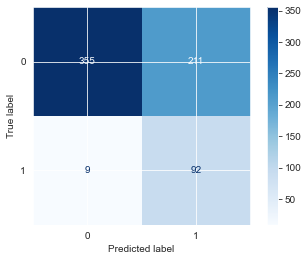

In [136]:
from sklearn.metrics import ConfusionMatrixDisplay

# Import confusion_matrix
from sklearn.metrics import confusion_matrix

# Print confusion matrix
cnf_matrix = confusion_matrix(y_test, y_hat_test_resampled)

disp = ConfusionMatrixDisplay(confusion_matrix=cnf_matrix, display_labels=model_log.classes_)
disp.plot(cmap=plt.cm.Blues)

AUC: 0.8339572473148374


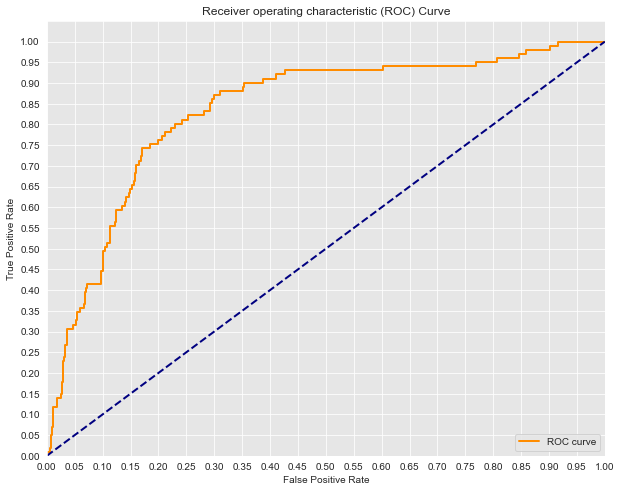

In [138]:
# Plotting the ROC curve
y_hat_test = logreg.predict(X_test_scaled)

y_score = logreg.decision_function(X_test_scaled)

fpr, tpr, thresholds = roc_curve(y_test, y_score)

sns.set_style('darkgrid', {'axes.facecolor': '0.9'})

print('AUC: {}'.format(auc(fpr, tpr)))
plt.figure(figsize=(10, 8))
lw = 2
logreg_fpr2_resampled = fpr
logreg_tpr2_resampled = tpr
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

The curve is closer to the top-left corner, with a high AUC value indicating the classifier has a high true positive rate and a low false positive rate. This indicates a better performance of the model after balancing.

#### Multicolinearity features


###### **Model 1**

In [139]:
X= df.drop(columns=['state','churn', 'total day minutes', 'total eve minutes', 'total night minutes', 'total intl minutes'], axis =1 )
y = df['churn']

# train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42 )

#Standerdize the features
scale = StandardScaler()
X_train_scaled = scale.fit_transform(X_train)
X_test_scaled = scale.transform(X_test)

# Instantiate the mode
logreg = LogisticRegression(fit_intercept=False, C=1e12, solver='liblinear', random_state=42)

# fit the model
model_log = logreg.fit(X_train_scaled, y_train)

In [140]:
y_hat_train = logreg.predict(X_train_scaled)
y_hat_test = logreg.predict(X_test_scaled)

from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score

print('Training Precision: ', precision_score(y_train, y_hat_train))
print('Testing Precision: ', precision_score(y_test, y_hat_test))
print('\n\n')

print('Training Recall: ', recall_score(y_train, y_hat_train))
print('Testing Recall: ', recall_score(y_test, y_hat_test))
print('\n\n')

print('Training Accuracy: ', accuracy_score(y_train, y_hat_train))
print('Testing Accuracy: ', accuracy_score(y_test, y_hat_test))
print('\n\n')

print('Training F1-Score: ', f1_score(y_train, y_hat_train))
print('Testing F1-Score: ', f1_score(y_test, y_hat_test))

# Additional: Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_hat_test)
print("\nConfusion Matrix:\n", conf_matrix)

Training Precision:  0.29103815439219166
Testing Precision:  0.31010452961672474



Training Recall:  0.8586387434554974
Testing Recall:  0.8811881188118812



Training Accuracy:  0.6800450112528132
Testing Accuracy:  0.6851574212893553



Training F1-Score:  0.43472498343273697
Testing F1-Score:  0.4587628865979381

Confusion Matrix:
 [[368 198]
 [ 12  89]]


In [141]:
# predict the model
y_hat_train = logreg.predict(X_train_scaled)
y_hat_test = logreg.predict(X_test_scaled)

# calculating the metrics
print('Training Precision: ', precision_score(y_train, y_hat_train))
print('Testing Precision: ', precision_score(y_test, y_hat_test))
print('\n\n')

print('Training Recall: ', recall_score(y_train, y_hat_train))
print('Testing Recall: ', recall_score(y_test, y_hat_test))
print('\n\n')

print('Training Accuracy: ', accuracy_score(y_train, y_hat_train))
print('Testing Accuracy: ', accuracy_score(y_test, y_hat_test))
print('\n\n')

print('Training F1-Score: ', f1_score(y_train, y_hat_train))
print('Testing F1-Score: ', f1_score(y_test, y_hat_test))

Training Precision:  0.29103815439219166
Testing Precision:  0.31010452961672474



Training Recall:  0.8586387434554974
Testing Recall:  0.8811881188118812



Training Accuracy:  0.6800450112528132
Testing Accuracy:  0.6851574212893553



Training F1-Score:  0.43472498343273697
Testing F1-Score:  0.4587628865979381


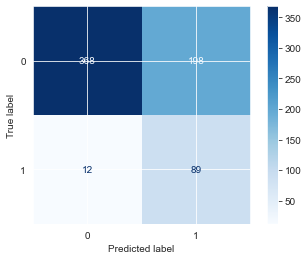

In [142]:
# Print confusion matrix
cnf_matrix = confusion_matrix(y_test, y_hat_test)

disp = ConfusionMatrixDisplay(confusion_matrix=cnf_matrix, display_labels=model_log.classes_)
disp.plot(cmap=plt.cm.Blues)

In [143]:
#calculate the probability scores of each of the datapoints:
y_score = logreg.fit(X_train_scaled, y_train).decision_function(X_test_scaled)

fpr, tpr, thresholds = roc_curve(y_test, y_score)

print('AUC: {}'.format(auc(fpr, tpr)))

AUC: 0.824843438407445


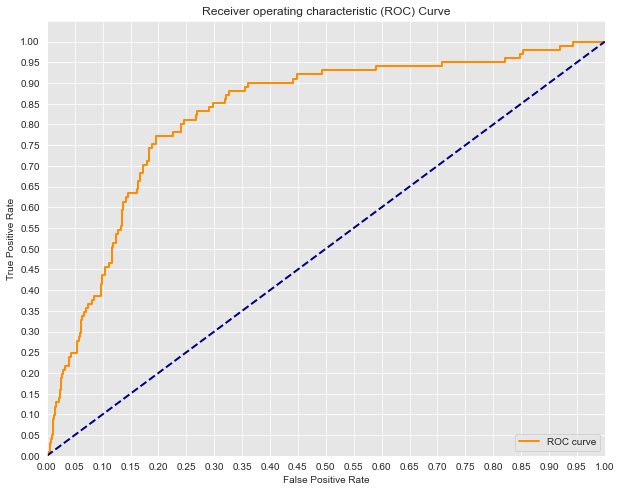

In [144]:
sns.set_style('darkgrid', {'axes.facecolor': '0.9'})

# Plotting the ROC curve
plt.figure(figsize=(10, 8))
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve')

logreg_fpr3 = fpr
logreg_tpr3 = tpr
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [145]:
# performing SMOTE

# Previous original class distribution
print('Original class distribution: \n')
print(y.value_counts())
smote = SMOTE()
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train) 
# Preview synthetic sample class distribution
print('-----------------------------------------')
print('Synthetic sample class distribution: \n')
print(pd.Series(y_train_resampled).value_counts()) 

Original class distribution: 

0    2850
1     483
Name: churn, dtype: int64
-----------------------------------------
Synthetic sample class distribution: 

1    2284
0    2284
Name: churn, dtype: int64


In [146]:
# Convert to NumPy arrays without feature names
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# Apply SMOTE to the train set
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train)

# Instantiate the model
logreg = LogisticRegression(fit_intercept=False, C=1e12, solver='liblinear', random_state=42)

# fit the model
model_log = logreg.fit(X_train_resampled, y_train_resampled)

# Predict on the resampled train & test set 
y_hat_train_resampled = logreg.predict(X_train_resampled)
y_hat_test_resampled = logreg.predict(X_test_scaled)

# Calculate precision, accuracy, recall, and F1 score
print('Training Precision: ', precision_score(y_train_resampled, y_hat_train_resampled))
print('Testing Precision: ', precision_score(y_test, y_hat_test_resampled))
print('\n\n')
print('Training Recall: ', recall_score(y_train_resampled, y_hat_train_resampled))
print('Testing Recall: ', recall_score(y_test, y_hat_test_resampled))
print('\n\n')
print('Training Accuracy: ', accuracy_score(y_train_resampled, y_hat_train_resampled))
print('Testing Accuracy: ', accuracy_score(y_test, y_hat_test_resampled))
print('\n\n')
print('Training F1-Score: ', f1_score(y_train_resampled, y_hat_train_resampled))
print('Testing F1-Score: ', f1_score(y_test, y_hat_test_resampled))


from sklearn.metrics import confusion_matrix
print('\n\n')
# confusion matrix for training set
conf_matrix_resampled = confusion_matrix(y_train_resampled, y_hat_train_resampled)
print("Confusion Matrix for training set (after SMOTE):\n", conf_matrix_resampled)
print('\n\n')
# confusion matrix for testing set
conf_matrix_resampled = confusion_matrix(y_test, y_hat_test_resampled)
print("Confusion Matrix for testing set (after SMOTE):\n", conf_matrix_resampled)

Training Precision:  0.7012278308321964
Testing Precision:  0.2996742671009772



Training Recall:  0.9001751313485113
Testing Recall:  0.9108910891089109



Training Accuracy:  0.7583187390542907
Testing Accuracy:  0.664167916041979



Training F1-Score:  0.7883435582822085
Testing F1-Score:  0.4509803921568628



Confusion Matrix for training set (after SMOTE):
 [[1408  876]
 [ 228 2056]]



Confusion Matrix for testing set (after SMOTE):
 [[351 215]
 [  9  92]]


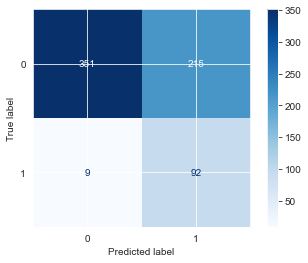

In [147]:
from sklearn.metrics import ConfusionMatrixDisplay

# Import confusion_matrix
from sklearn.metrics import confusion_matrix

# Print confusion matrix
cnf_matrix = confusion_matrix(y_test, y_hat_test_resampled)

disp = ConfusionMatrixDisplay(confusion_matrix=cnf_matrix, display_labels=model_log.classes_)
disp.plot(cmap=plt.cm.Blues)

AUC: 0.8351292726445789


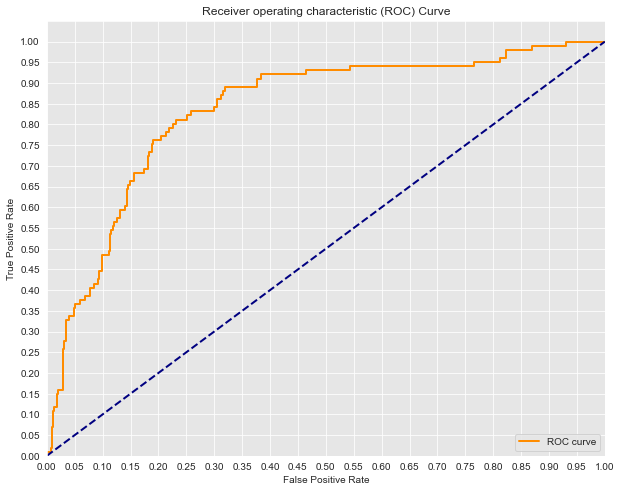

In [148]:
# Plotting the ROC curve
y_hat_test = logreg.predict(X_test_scaled)

y_score = logreg.decision_function(X_test_scaled)

fpr, tpr, thresholds = roc_curve(y_test, y_score)

sns.set_style('darkgrid', {'axes.facecolor': '0.9'})

print('AUC: {}'.format(auc(fpr, tpr)))
plt.figure(figsize=(10, 8))
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve')

logreg_fpr3_resampled = fpr
logreg_tpr3_resampled = tpr

plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

## ii) K-Nearest Neighbors (KNN) Model

In [155]:
# Import KNeighborsClassifier
from sklearn.neighbors import KNeighborsClassifier

X= df.drop(columns=["state","churn"], axis =1 )
y = df["churn"]

# train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42 )

#Standerdize the features
scaler = StandardScaler()
X_train_scaled = scale.fit_transform(X_train)
X_test_scaled = scale.transform(X_test)

#Convert into a DataFrame
X_train_scaled = pd.DataFrame(X_train_scaled, columns=[X_train.columns])
X_test_scaled = pd.DataFrame(X_test_scaled, columns=[X_train.columns])

# Instantiate the mode
knn = KNeighborsClassifier(n_neighbors=3)

# fit the model
knn.fit(X_train_scaled, y_train)

# Calculate the probability scores of each datapoint for the positive class (class 1)
y_score = knn.predict_proba(X_test_scaled)[:, 1]
y_train_score = knn.predict_proba(X_train_scaled)[:, 1]

# predict the model
y_hat_train = knn.predict(X_train_scaled)
y_hat_test = knn.predict(X_test_scaled)

In [156]:
# calculating the metrics

print('Training Precision: ', precision_score(y_train, y_hat_train))
print('Testing Precision: ', precision_score(y_test, y_hat_test))
print('\n\n')

print('Training Recall: ', recall_score(y_train, y_hat_train))
print('Testing Recall: ', recall_score(y_test, y_hat_test))
print('\n\n')

print('Training Accuracy: ', accuracy_score(y_train, y_hat_train))
print('Testing Accuracy: ', accuracy_score(y_test, y_hat_test))
print('\n\n')

print('Training F1-Score: ', f1_score(y_train, y_hat_train))
print('Testing F1-Score: ', f1_score(y_test, y_hat_test))

# Additional: Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_hat_test)
print("\nConfusion Matrix:\n", conf_matrix)

Training Precision:  0.9016393442622951
Testing Precision:  0.7872340425531915



Training Recall:  0.5759162303664922
Testing Recall:  0.36633663366336633



Training Accuracy:  0.9302325581395349
Testing Accuracy:  0.889055472263868



Training F1-Score:  0.7028753993610224
Testing F1-Score:  0.5

Confusion Matrix:
 [[556  10]
 [ 64  37]]


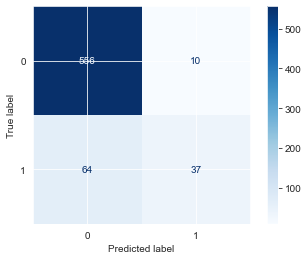

In [157]:
# Print confusion matrix
cnf_matrix = confusion_matrix(y_test, y_hat_test)

disp = ConfusionMatrixDisplay(confusion_matrix=cnf_matrix, display_labels=knn.classes_)
disp.plot(cmap=plt.cm.Blues)

In [160]:
# calculating the AUC value
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_score)
fpr, tpr, thresholds = roc_curve(y_test, y_score)

roc_auc_train = auc(fpr_train, tpr_train)
roc_auc = auc(fpr, tpr)
print('Train AUC: {}'.format(auc(fpr_train, tpr_train)))
print('Test AUC: {}'.format(auc(fpr, tpr)))

Train AUC: 0.9711136428237408
Test AUC: 0.816079487807438


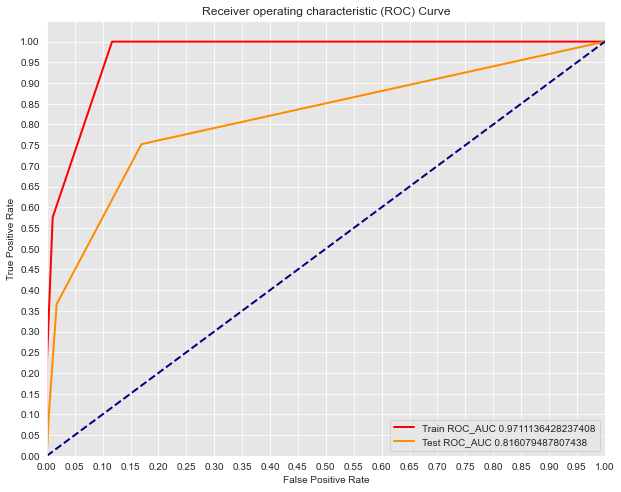

In [159]:
# plotting the ROC curve

sns.set_style('darkgrid', {'axes.facecolor': '0.9'})

plt.figure(figsize=(10, 8))
lw = 2
plt.plot(fpr_train, tpr_train, color='red',
         lw=lw, label=f'Train ROC_AUC {roc_auc_train }')

plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label=f'Test ROC_AUC {roc_auc }')

plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

#####  **Resampling**

In [161]:
# Previous original class distribution
print('Original class distribution: \n')
print(y.value_counts())
smote = SMOTE()
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train) 
# Preview synthetic sample class distribution
print('-----------------------------------------')
print('Synthetic sample class distribution: \n')
print(pd.Series(y_train_resampled).value_counts()) 

Original class distribution: 

0    2850
1     483
Name: churn, dtype: int64
-----------------------------------------
Synthetic sample class distribution: 

1    2284
0    2284
Name: churn, dtype: int64


In [171]:
# Apply SMOTE to the test set
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train) 

knn2
# Predict on the resampled test set
y_hat_test_resampled = knn.predict(X_test_scaled)
y_hat_train_resampled = knn.predict(X_train_resampled)


print('Training Resampled Precision: ', precision_score(y_train_resampled, y_hat_train_resampled))
print('Testing Resampled Precision: ', precision_score(y_test, y_hat_test_resampled))
print('\n\n')

print('Training Resampled Recall: ', recall_score(y_train_resampled, y_hat_train_resampled))
print('Testing Resampled Recall: ', recall_score(y_test, y_hat_test_resampled))
print('\n\n')

print('Training Resampled Accuracy: ', accuracy_score(y_train_resampled, y_hat_train_resampled))
print('Testing Resampled Accuracy: ', accuracy_score(y_test, y_hat_test_resampled))
print('\n\n')

print('Training Resampled F1-Score: ', f1_score(y_train_resampled, y_hat_train_resampled))
print('Testing Resampled F1-Score: ', f1_score(y_test, y_hat_test_resampled))

conf_matrix_train_resampled = confusion_matrix(y_train_resampled, y_hat_train_resampled)
conf_matrix_resampled = confusion_matrix(y_test, y_hat_test_resampled)

# Print the confusion matrix
print("Train Confusion Matrix (after SMOTE):\n", conf_matrix_train_resampled)
print()
print("Test Confusion Matrix (after SMOTE):\n", conf_matrix_resampled)

Training Resampled Precision:  0.9860627177700348
Testing Resampled Precision:  0.7872340425531915



Training Resampled Recall:  0.7434325744308231
Testing Resampled Recall:  0.36633663366336633



Training Resampled Accuracy:  0.8664623467600701
Testing Resampled Accuracy:  0.889055472263868



Training Resampled F1-Score:  0.8477284073889166
Testing Resampled F1-Score:  0.5
Train Confusion Matrix (after SMOTE):
 [[2260   24]
 [ 586 1698]]

Test Confusion Matrix (after SMOTE):
 [[556  10]
 [ 64  37]]


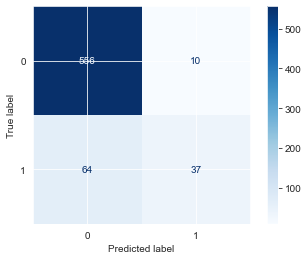

In [173]:
# Print confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_resampled, display_labels=knn.classes_)
disp.plot(cmap=plt.cm.Blues)

Train AUC: 0.9810002806395515
Test AUC: 0.816079487807438


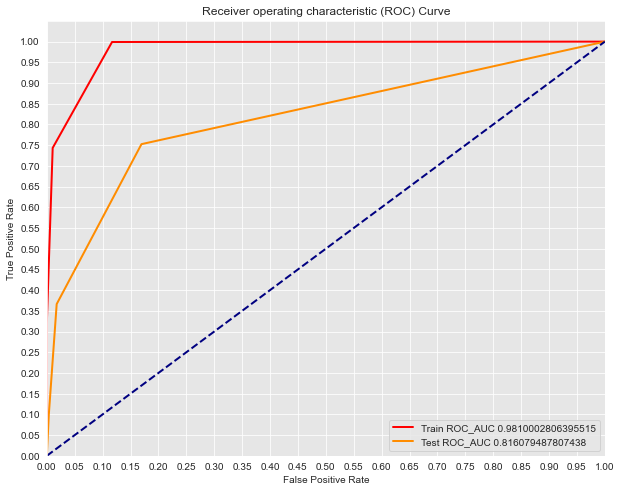

In [174]:
y_score = knn.predict_proba(X_test_scaled)[:, 1]
y_train_score_resampled = knn.predict_proba(X_train_resampled)[:, 1]

# calculating the AUC value
fpr_train_resampled, tpr_train_resampled, thresholds_train_resampled = roc_curve(y_train_resampled, y_train_score_resampled)
fpr, tpr, thresholds = roc_curve(y_test, y_score)

roc_auc_train_resampled = auc(fpr_train_resampled, tpr_train_resampled)
roc_auc = auc(fpr, tpr)
print('Train AUC: {}'.format(auc(fpr_train_resampled, tpr_train_resampled)))
print('Test AUC: {}'.format(auc(fpr, tpr)))

# plotting the ROC curve

sns.set_style('darkgrid', {'axes.facecolor': '0.9'})

plt.figure(figsize=(10, 8))
lw = 2
plt.plot(fpr_train_resampled, tpr_train_resampled, color='red',
         lw=lw, label=f'Train ROC_AUC  {roc_auc_train_resampled }')

plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label=f'Test ROC_AUC {roc_auc }')

plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [175]:
# Fit a model
KNN = KNeighborsClassifier(n_neighbors=5)
KNN.fit(X_train_resampled, y_train_resampled)


# Predict
# Calculate the probability scores of each datapoint for the positive class (class 1)
y_score = KNN.predict_proba(X_test_scaled)[:, 1]
y_train_score = KNN.predict_proba(X_train_resampled)[:, 1]

# predict the model
y_hat_train_resampled = KNN.predict(X_train_resampled)
y_hat_test_resampled = KNN.predict(X_test_scaled)

# calculate the metrics


print('Training Resampled Precision: ', precision_score(y_train_resampled, y_hat_train_resampled))
print('Testing Resampled Precision: ', precision_score(y_test, y_hat_test_resampled))
print('\n\n')

print('Training Resampled Recall: ', recall_score(y_train_resampled, y_hat_train_resampled))
print('Testing Resampled Recall: ', recall_score(y_test, y_hat_test_resampled))
print('\n\n')

print('Training Resampled Accuracy: ', accuracy_score(y_train_resampled, y_hat_train_resampled))
print('Testing Resampled Accuracy: ', accuracy_score(y_test, y_hat_test_resampled))
print('\n\n')

print('Training Resampled F1-Score: ', f1_score(y_train_resampled, y_hat_train_resampled))
print('Testing Resampled F1-Score: ', f1_score(y_test, y_hat_test_resampled))

conf_matrix_train_resampled = confusion_matrix(y_train_resampled, y_hat_train_resampled)
conf_matrix_resampled = confusion_matrix(y_test, y_hat_test_resampled)

# Print the confusion matrix
print("Train Confusion Matrix (after SMOTE):\n", conf_matrix_train_resampled)
print()
print("Test Confusion Matrix (after SMOTE):\n", conf_matrix_resampled)


Training Resampled Precision:  0.8833333333333333
Testing Resampled Precision:  0.42857142857142855



Training Resampled Recall:  0.9978108581436077
Testing Resampled Recall:  0.7722772277227723



Training Resampled Accuracy:  0.9330122591943958
Testing Resampled Accuracy:  0.8095952023988006



Training Resampled F1-Score:  0.9370888157894737
Testing Resampled F1-Score:  0.5512367491166077
Train Confusion Matrix (after SMOTE):
 [[1983  301]
 [   5 2279]]

Test Confusion Matrix (after SMOTE):
 [[462 104]
 [ 23  78]]


Train AUC: 0.9972691317963078
Test AUC: 0.8579050484553756


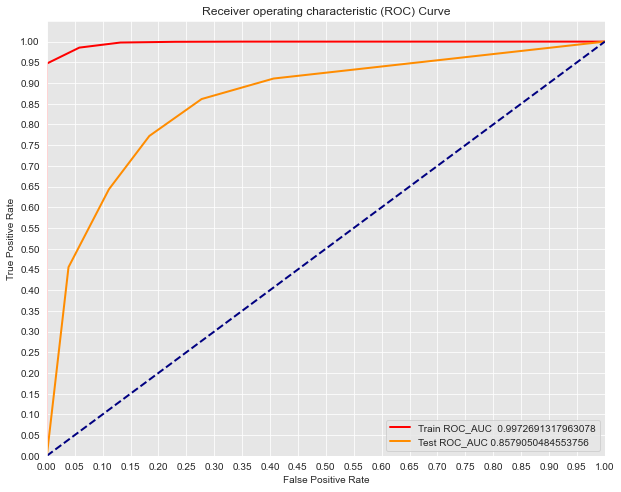

In [176]:
# calculating the AUC value
fpr_train_resampled, tpr_train_resampled, thresholds_train_resampled = roc_curve(y_train_resampled, y_train_score)
fpr, tpr, thresholds = roc_curve(y_test, y_score)

roc_auc_train_resampled = auc(fpr_train_resampled, tpr_train_resampled)
roc_auc = auc(fpr, tpr)
print('Train AUC: {}'.format(auc(fpr_train_resampled, tpr_train_resampled)))
print('Test AUC: {}'.format(auc(fpr, tpr)))

# plotting the ROC curve

sns.set_style('darkgrid', {'axes.facecolor': '0.9'})

plt.figure(figsize=(10, 8))
lw = 2
plt.plot(fpr_train_resampled, tpr_train_resampled, color='red',
         lw=lw, label=f'Train ROC_AUC  {roc_auc_train_resampled }')

plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label=f'Test ROC_AUC {roc_auc }')

plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [179]:
def find_best_k(X_train, y_train, X_test, y_test, min_k=1, max_k=31):
    best_k = 0
    best_score = 0.0
    for k in range(min_k, max_k+1, 2):
        knn = KNeighborsClassifier(n_neighbors=k)
        knn.fit(X_train, y_train)
        preds = knn.predict(X_test)
        f1 = f1_score(y_test, preds)
        if f1 > best_score:
            best_k = k
            best_score = f1
    
    print("Best Value for k: {}".format(best_k))
    print("F1-Score: {}".format(best_score))

In [180]:
find_best_k(X_train_resampled, y_train_resampled, X_test_scaled, y_test)

Best Value for k: 25
F1-Score: 0.5951557093425606


In [181]:
def find_best_k(X_train, y_train, X_test, y_test, min_k=1, max_k=31):
    best_k = 0
    best_score = 0.0
    precision_ = 0.0
    recall_ = 0.0
    accuracy_ = 0.0
    k_range = range(min_k, max_k+1, 2)
    k_scores_accuracy = []
    for k in k_range:
        knn = KNeighborsClassifier(n_neighbors=k)
        knn.fit(X_train, y_train)
        preds = knn.predict(X_test)
        f1 = f1_score(y_test, preds)
        precision= precision_score(y_test, preds)
        recall = recall_score(y_test, preds)
        accuracy = accuracy_score(y_test, preds)
        k_scores_accuracy.append(accuracy)

        if f1 > best_score:
            best_k = k
            best_score = f1
            precision_ = precision
            recall_ = recall
            accuracy_ = accuracy
    plt.plot(k_range, k_scores_accuracy)
    plt.xticks(k_range)
    plt.xlabel('K values')
    plt.ylabel('Model Accuracy')

    print("Best Value for k: {}".format(best_k))
    print("F1-Score: {}".format(best_score))
    print("Precision: {}".format(precision_))
    print("Recall: {}".format(recall_))
    print("Accuracy: {}".format(accuracy_))

Best Value for k: 25
F1-Score: 0.5951557093425606
Precision: 0.4574468085106383
Recall: 0.8514851485148515
Accuracy: 0.8245877061469266


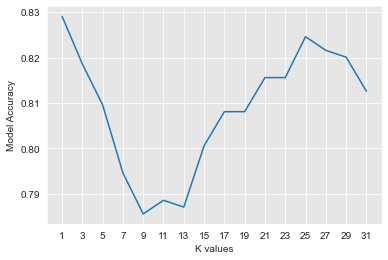

In [182]:
find_best_k(X_train_resampled, y_train_resampled, X_test_scaled, y_test)

In [194]:
# Using cross validation
from sklearn.model_selection import cross_val_score

knn_cv = KNeighborsClassifier(n_neighbors=3) 
y_scores = cross_val_score(
    knn_cv,
    X_train_resampled,
    y_train_resampled,
    cv=5,
    scoring='f1' # 'f1' etc..
)

In [195]:
print(f"Y scores for k = 3 and cv = 5\n{y_scores}")
print()
print(f"Mean f1 score for k:{y_scores.mean()}")

Y scores for k = 3 and cv = 5
[0.90688259 0.908      0.91549296 0.91733871 0.92510121]

Mean f1 score for k:0.9145630946183829


In [196]:
knn_best = KNeighborsClassifier(n_neighbors=25) 
y_scores = cross_val_score(
    knn_best,
    X_train_resampled,
    y_train_resampled,
    cv=5,
    scoring='f1' # 'f1' etc..
)

In [197]:
print(f"Y scores for k = 25 and cv = 5\n{y_scores}")
print()
print(f"Mean f1 score for k:{y_scores.mean()}")

Y scores for k = 25 and cv = 5
[0.85507246 0.87525562 0.8825332  0.872579   0.89370485]

Mean f1 score for k:0.8758290272021003


In [198]:
knn_best = KNeighborsClassifier(n_neighbors=25) 
y_scores = cross_val_score(
    knn_best,
    X_train_resampled,
    y_train_resampled,
    cv=10,
    scoring='f1'
)

In [199]:
print(f"Y scores for k = 25 and cv = 10\n{y_scores}")
print()
print(f"Mean f1 score for k:{y_scores.mean()}")

Y scores for k = 25 and cv = 10
[0.84583333 0.86792453 0.86597938 0.88270378 0.90612245 0.876
 0.87025948 0.86227545 0.89205703 0.90456432]

Mean f1 score for k:0.8773719741363092


##  iii) Decision Trees Model

In [200]:
from sklearn.tree import DecisionTreeClassifier

X= df.drop(columns=['state','churn'], axis =1 )
y = df['churn']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Standerdize the features
scaler = StandardScaler()
X_train_scaled = scale.fit_transform(X_train)
X_test_scaled = scale.transform(X_test)

# Train a DT classifier
clf = DecisionTreeClassifier(random_state=42)
clf.fit(X_train_scaled, y_train)

# Make predictions on the test set
predictions= clf.predict(X_test_scaled)

# Make predictions for test data
y_pred = clf.predict(X_test_scaled)

In [201]:
y_hat_train = clf.predict(X_train_scaled)
y_hat_test = clf.predict(X_test_scaled)

# calculating the metrics
print('Training Precision: ', precision_score(y_train, y_hat_train))
print('Testing Precision: ', precision_score(y_test, y_hat_test))
print('\n\n')

print('Training Recall: ', recall_score(y_train, y_hat_train))
print('Testing Recall: ', recall_score(y_test, y_hat_test))
print('\n\n')

print('Training Accuracy: ', accuracy_score(y_train, y_hat_train))
print('Testing Accuracy: ', accuracy_score(y_test, y_hat_test))
print('\n\n')

print('Training F1-Score: ', f1_score(y_train, y_hat_train))
print('Testing F1-Score: ', f1_score(y_test, y_hat_test))

Training Precision:  1.0
Testing Precision:  0.7403846153846154



Training Recall:  1.0
Testing Recall:  0.7623762376237624



Training Accuracy:  1.0
Testing Accuracy:  0.9235382308845578



Training F1-Score:  1.0
Testing F1-Score:  0.751219512195122


In [202]:
# Calculate accuracy 
acc = accuracy_score(y_test, y_pred) * 100
print('Accuracy is :{0}'.format(acc))

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print('\nAUC is :{0}'.format(round(roc_auc, 2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Accuracy is :92.35382308845578

AUC is :0.86

Confusion Matrix
----------------


Predicted,0,1,All
True,,,
0,539,27,566
1,24,77,101
All,563,104,667


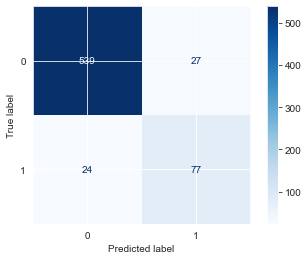

In [203]:
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix

cnf_matrix = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cnf_matrix, display_labels=clf.classes_)
disp.plot(cmap=plt.cm.Blues)

**Fine tuning**

Finding the best parameter using Entropy

In [204]:
# Instantiate and fit a DecisionTreeClassifier
classifier_2 = DecisionTreeClassifier(random_state=42, criterion='entropy')  
classifier_2.fit(X_train, y_train)


DecisionTreeClassifier(criterion='entropy', random_state=42)

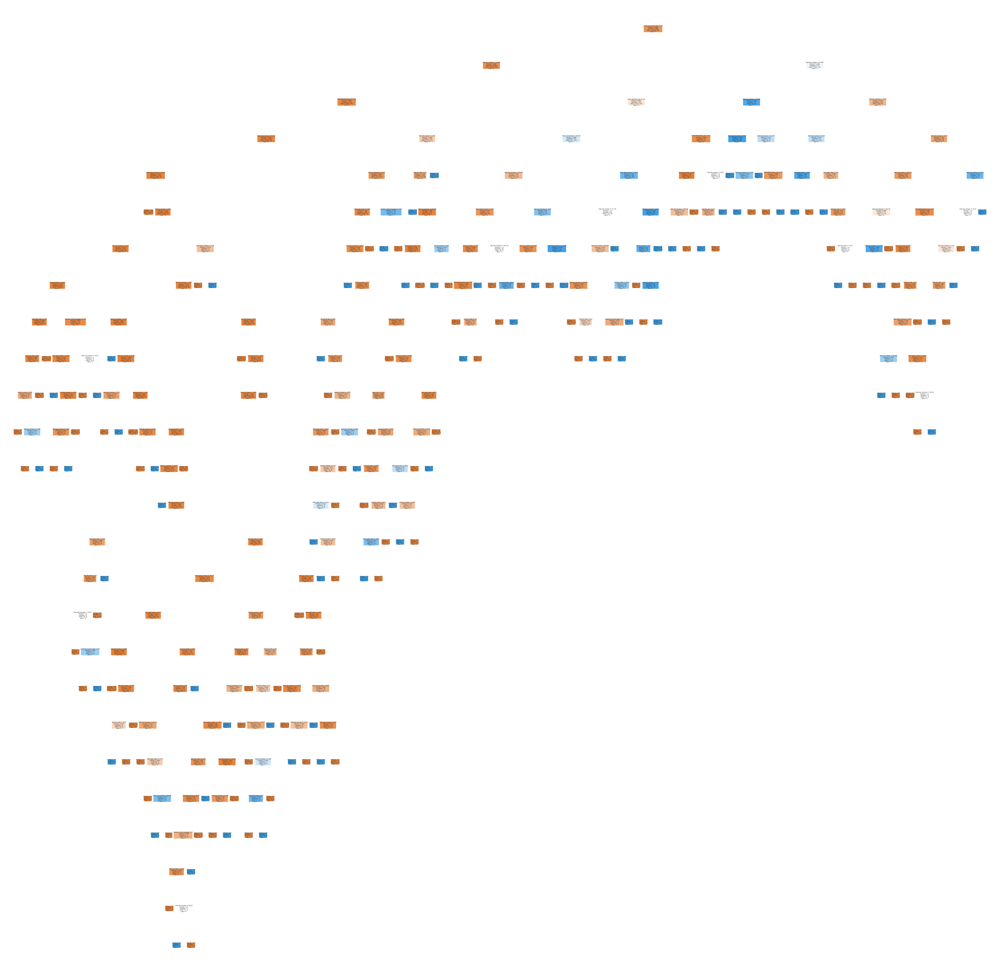

In [206]:
# Plot and show decision tree
from sklearn import tree
plt.figure(figsize=(12,12), dpi=500, edgecolor='blue')
tree.plot_tree(classifier_2, 
               feature_names=X.columns,
               class_names=np.unique(y).astype('str'),
               filled=True, rounded=True)
plt.show()

In [209]:
y_score = classifier_2.predict_proba(X_test_scaled)[:, 1]
y_train_score = classifier_2.predict_proba(X_train_scaled)[:, 1]

In [210]:
y_hat_train = classifier_2.predict(X_train_scaled)
y_hat_test = classifier_2.predict(X_test_scaled)

# calculating the metrics
print('Training Precision: ', precision_score(y_train, y_hat_train))
print('Testing Precision: ', precision_score(y_test, y_hat_test))
print('\n\n')

print('Training Recall: ', recall_score(y_train, y_hat_train))
print('Testing Recall: ', recall_score(y_test, y_hat_test))
print('\n\n')

print('Training Accuracy: ', accuracy_score(y_train, y_hat_train))
print('Testing Accuracy: ', accuracy_score(y_test, y_hat_test))
print('\n\n')

print('Training F1-Score: ', f1_score(y_train, y_hat_train))
print('Testing F1-Score: ', f1_score(y_test, y_hat_test))

Training Precision:  0.43656716417910446
Testing Precision:  0.40298507462686567



Training Recall:  0.306282722513089
Testing Recall:  0.26732673267326734



Training Accuracy:  0.8439609902475619
Testing Accuracy:  0.8290854572713643



Training F1-Score:  0.36
Testing F1-Score:  0.3214285714285714


**Balancing**

Class imbalance using SMOTE

In [215]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Standerdize the features
scaler = StandardScaler()
X_train_scaled = scale.fit_transform(X_train)
X_test_scaled = scale.transform(X_test)

# Train a DT classifier
smote1 = SMOTE(sampling_strategy='minority', random_state=420)
X_train_over, y_train_over = smote1.fit_resample(X_train_scaled, y_train)

# Summarize class distribution
#print('Counter'(y_train_over))

clf3 = DecisionTreeClassifier(random_state=420)                       

clf3.fit(X_train_over, y_train_over)

DecisionTreeClassifier(random_state=420)

In [218]:
# Make predictions on the test set
y_pred_test= clf3.predict(X_test_scaled)

# # Make predictions for test data
y_pred_train = clf3.predict(X_train_over)

In [219]:
# calculating the metrics
print('Training Precision: ', precision_score(y_train_over, y_pred_train))
print('Testing Precision: ', precision_score(y_test, y_pred_test))
print('\n\n')

print('Training Recall: ', recall_score(y_train_over, y_pred_train))
print('Testing Recall: ', recall_score(y_test, y_pred_test))
print('\n\n')

print('Training Accuracy: ', accuracy_score(y_train_over, y_pred_train))
print('Testing Accuracy: ', accuracy_score(y_test, y_pred_test))
print('\n\n')

print('Training F1-Score: ', f1_score(y_train_over, y_pred_train))
print('Testing F1-Score: ', f1_score(y_test, y_pred_test))

Training Precision:  1.0
Testing Precision:  0.6090225563909775



Training Recall:  1.0
Testing Recall:  0.801980198019802



Training Accuracy:  1.0
Testing Accuracy:  0.8920539730134932



Training F1-Score:  1.0
Testing F1-Score:  0.6923076923076924


In [233]:
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import accuracy_score

# Assuming you have loaded and split your data
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the decision tree model
dt_model = DecisionTreeClassifier(random_state=42)

# Define the hyperparameters and values to search
param_grid = {
    'max_depth': np.arange(1, 10),
    'min_samples_split': np.arange(2, 10),
    'min_samples_leaf': np.arange(1, 5),
    'max_features': ['auto', 'sqrt', 'log2', None]
}

# Create the GridSearchCV object
grid_search = GridSearchCV(dt_model, param_grid, cv=5, scoring='accuracy')

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Get the best parameters
best_params = grid_search.best_params_

# Print the best parameters
print("Best Hyperparameters:", best_params)

# Get the best model
best_dt_model = grid_search.best_estimator_

# Make predictions on the test set using the best model
y_pred = best_dt_model.predict(X_test)

# Evaluate the performance of the best model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy of the Best Model:", accuracy)


Best Hyperparameters: {'max_depth': 6, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 5}
Accuracy of the Best Model: 0.9490254872563718


C:\Users\TASHA\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py:542: FitFailedWarning: 
1440 fits failed out of a total of 5760.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1440 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\TASHA\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py", line 890, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\TASHA\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py", line 1344, in wrapper
    estimator._validate_params()
  File "C:\Users\TASHA\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py", line 666, in _validate_params
    v

In [247]:
# Import DecisionTreeRegressor
from sklearn.tree import DecisionTreeRegressor

# Instantiate DecisionTreeRegressor 
# Set random_state=45
regressor = DecisionTreeRegressor(random_state=45)

# Fit the model to training data
regressor.fit(X_train_scaled, y_train)

# Make predictions on the test data
y_pred = regressor.predict(X_test_scaled)

# Calculate performance using the performance() function 
score = performance(y_test, y_pred)
score

[0.3116013014729033, 0.29741515111699174]

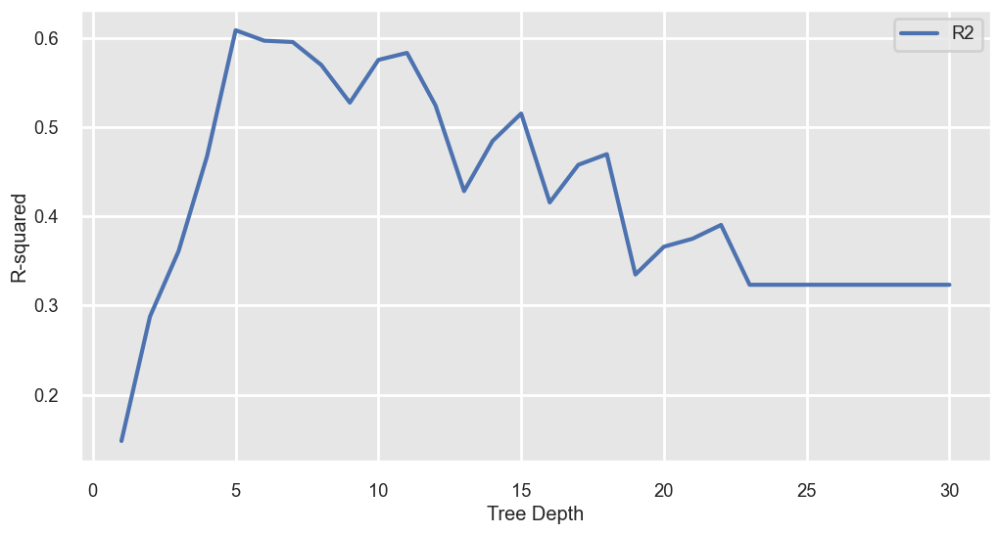

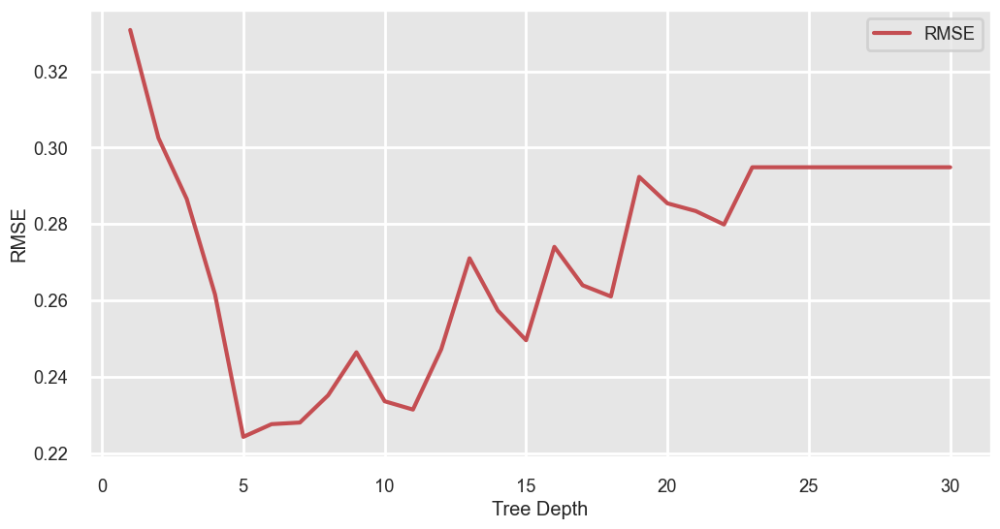

In [248]:
# Identify the optimal tree depth for given data
max_depths = list(range(1, 31))
mse_results = []
r2_results = []

for max_depth in max_depths:
    regressor = DecisionTreeRegressor(max_depth=max_depth, 
                                      random_state=45)
    regressor.fit(X_train, y_train)
    y_pred = regressor.predict(X_test)
    score = performance(y_test, y_pred)
    r2_results.append(score[0])
    mse_results.append(score[1])

plt.figure(figsize=(12, 6))
plt.plot(max_depths, r2_results, 'b', label='R2')
plt.xlabel('Tree Depth')
plt.ylabel('R-squared')
plt.legend()
plt.show()
plt.figure(figsize=(12, 6))
plt.plot(max_depths, mse_results, 'r', label='RMSE')
plt.xlabel('Tree Depth')
plt.ylabel('RMSE')
plt.legend()
plt.show()

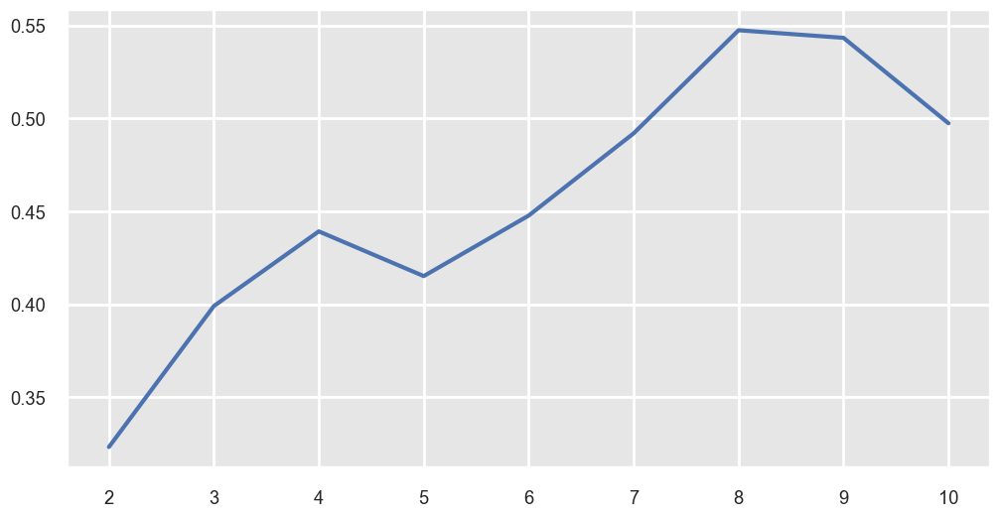

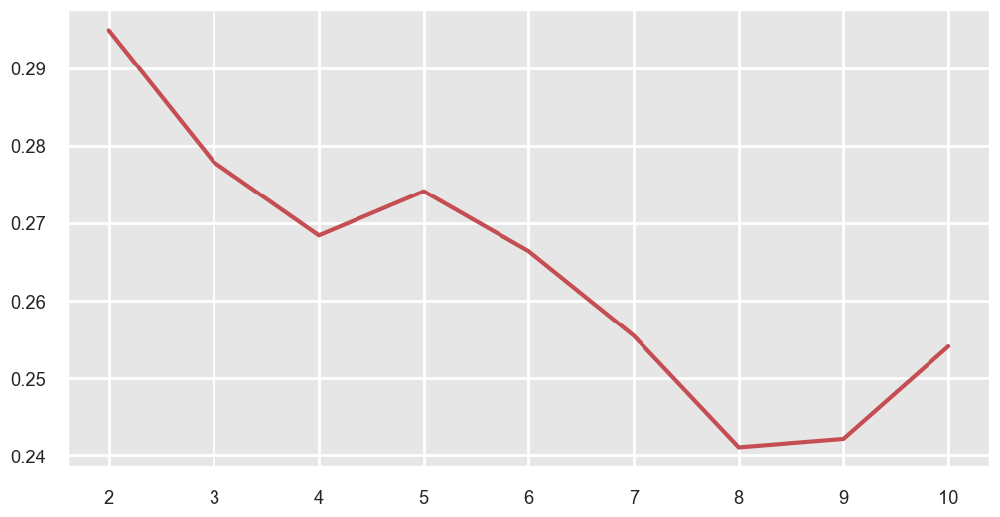

In [249]:
# Identify the optimal minimum split size for given data
min_samples_splits = np.arange(2, 11)
mse_results = []
r2_results = []

for min_samples_split in min_samples_splits:
    regressor = DecisionTreeRegressor(min_samples_split=int(min_samples_split),
                                      random_state=45)
    regressor.fit(X_train, y_train)
    y_pred = regressor.predict(X_test)
    score = performance(y_test, y_pred)
    r2_results.append(score[0])
    mse_results.append(score[1])

plt.figure(figsize=(6, 6))
plt.plot(min_samples_splits, r2_results, 'b', label='R2')
plt.xlabel('Minumun samples spilt')
plt.ylabel('R2')
plt.show()
plt.figure(figsize=(6, 6))
plt.xlabel('Minumun samples spilt')
plt.ylabel('MSE')
plt.plot(min_samples_splits, mse_results, 'r', label='RMSE')
plt.show()

**With Imbalanced data**

In [222]:
#separating features from the target variable
X = df.drop(['churn','state'],axis = 1)
y = df['churn']
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 42)

In [223]:
#scaling the X_train and x_test
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [234]:
#importing library and initializing the classifier
from sklearn.ensemble import RandomForestClassifier
r_forest = RandomforestClassifier(n_estimators=100, max_depth =5, max_features = min(15, 20))
r_forest.fit(X_train_scaled, y_train)

RandomForestClassifier(max_depth=5, max_features=15)

In [235]:
#generating predictions based on the X_test
y_ran_pred = r_forest.predict(X_test)
print(pd.Series(y_ran_pred).value_counts())

1    468
0    199
dtype: int64


In [236]:
#define the scores
recall_ran =recall_score(y_test, y_ran_pred)
precision_ran =precision_score(y_test, y_ran_pred)
f1score_ran =f1_score(y_test, y_ran_pred)
accuracy_ran= accuracy_score(y_test, y_ran_pred)

#print the scores
print(f'Accuracy score: {accuracy_ran}\n')
print(f'Precision score: {precision_ran}\n')
print(f'Recall score: {recall_ran}\n')
print(f'f1 score: {f1score_ran}\n')

#getting the AUC score
from sklearn.metrics import roc_auc_score
y_ran_prob = r_forest.predict_proba(X_test)[:, 1]

# Calculate the AUC score
auc_score = roc_auc_score(y_test, y_ran_prob)
print(f'AUC score: {auc_score}')

Accuracy score: 0.39580209895052476

Precision score: 0.17735042735042736

Recall score: 0.8217821782178217

f1 score: 0.29173989455184535

AUC score: 0.5371899380750795


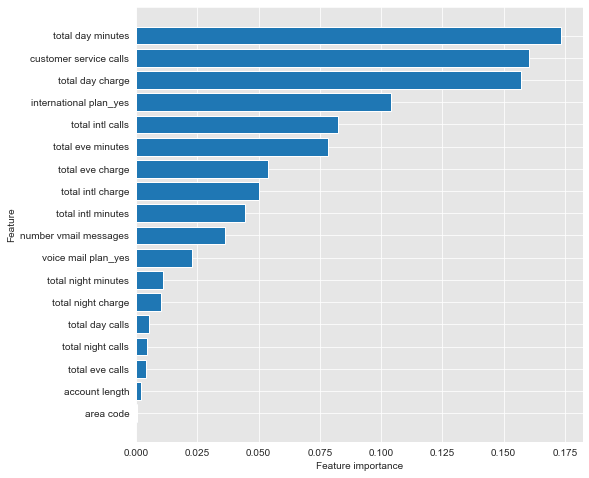

In [237]:
#examining how each feature ended up being important in our decison tree.
def plot_feature_importances(model):
    n_features = X_train.shape[1]
    feature_names = X_train.columns.values
    feature_importances = model.feature_importances_
    indices = np.argsort(feature_importances)[::+1]
    plt.figure(figsize=(8,8))
    plt.barh(range(n_features),feature_importances[indices], align='center') 
    plt.yticks(np.arange(n_features), feature_names[indices]) 
    plt.xlabel('Feature importance')
    plt.ylabel('Feature')
#looking at the feature importance
plot_feature_importances(r_forest)

With Balanced Data

In [238]:
y_train.value_counts()

0    2284
1     382
Name: churn, dtype: int64

In [239]:
#importing smote from oversampling
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
#resample the train dataset
X_train_over, y_train_over = smote.fit_resample(X_train, y_train)
print(pd.Series(y_train_over).value_counts()) 

1    2284
0    2284
Name: churn, dtype: int64


In [242]:
#Initialize another random forest model
r_forest_smote = RandomForestClassifier(n_estimators=100, max_depth=5, max_features=min(15, 20))
#fit the model on the oversampled data
r_forest_smote.fit(X_train_over, y_train_over)
#predict the model
y_ran_pred1 = r_forest_smote.predict(X_test)

#evaluate the model using recall, precison, accuracy and f1score
recall_ran1 =recall_score(y_test, y_ran_pred1)
precision_ran1 =precision_score(y_test, y_ran_pred1)
f1score_ran1 =f1_score(y_test, y_ran_pred1)
accuracy_ran1= accuracy_score(y_test, y_ran_pred1)

#print the results
print(f'Accuracy score: {accuracy_ran1}\n')
print(f'Precision score: {precision_ran1}\n')
print(f'Recall score: {recall_ran1}\n')
print(f'f1 score: {f1score_ran1}\n')

#getting the AUC score 
from sklearn.metrics import roc_auc_score
y_ran_prob1 = r_forest_smote.predict_proba(X_test)[:, 1]
# Calculate the AUC score
auc_score1 = roc_auc_score(y_test, y_ran_prob1)
print(f'AUC score: {auc_score1}')

Accuracy score: 0.9295352323838081

Precision score: 0.7547169811320755

Recall score: 0.7920792079207921

f1 score: 0.7729468599033816

AUC score: 0.8952349298534092


Balancing the data led to a trade-off, with improved recall but a decrease in precision.

In [244]:
#checking the distribution for the predicted values 
print(pd.Series(y_ran_pred1).value_counts())

0    561
1    106
dtype: int64


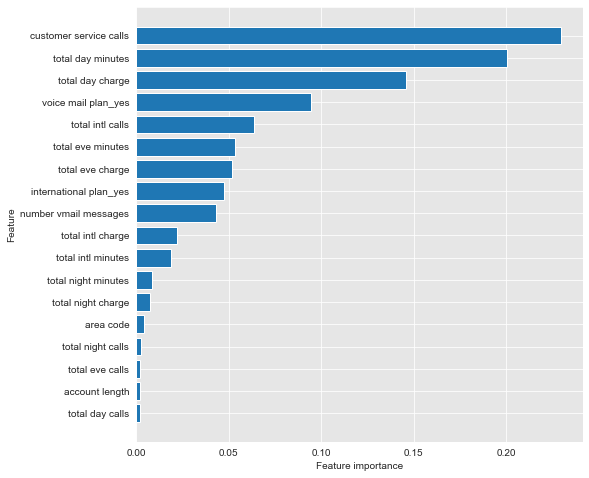

In [245]:
#looking at the feature importance
plot_feature_importances(r_forest_smote)

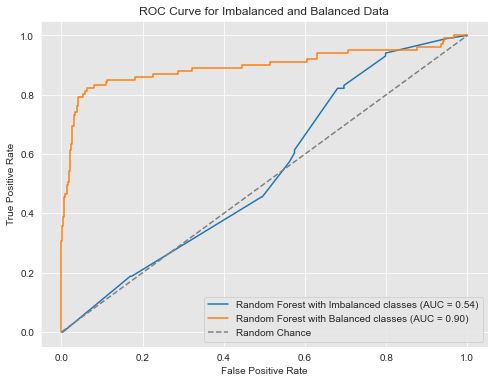

In [246]:
#plotting an ROC curve to check model performanced for imbalanced and balanced dataset
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Predict probabilities and calculate the ROC curve for imbalanced data model
fpr, tpr, thresholds = roc_curve(y_test, r_forest.predict_proba(X_test)[:, 1])
# Calculate AUC for the first model
auc_score = roc_auc_score(y_test, y_ran_prob)
# Predict probabilities and calculate the ROC curve for balanced data model
fpr1, tpr1, thresholds1 = roc_curve(y_test, r_forest_smote.predict_proba(X_test)[:, 1])
# Calculate AUC for the second model
auc_score1 = roc_auc_score(y_test, y_ran_prob1)
# Predict probabilities and calculate the ROC curve for tuned model
fpr1, tpr1, thresholds1 = roc_curve(y_test, r_forest_smote.predict_proba(X_test)[:, 1])
# Calculate AUC for the second model
auc_score1 = roc_auc_score(y_test, y_ran_prob1)

# Plot the ROC curves for both models on the same axis
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'Random Forest with Imbalanced classes (AUC = {auc_score:.2f})')
plt.plot(fpr1, tpr1, label=f'Random Forest with Balanced classes (AUC = {auc_score1:.2f})')
# Plot ROC curve for random chance
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Chance')
# Set labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Imbalanced and Balanced Data')
plt.legend()

# Display the plot
plt.show()


Hyperparameter Tuning Using Gridsearch

In [247]:
#import gridsearch
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for tuning
param_grid = {
    'max_depth': range(1, 15),  # Adjust the range based on your preference
}

# # Initialize the GridSearchCV object
grid_search = GridSearchCV(estimator=RandomForestClassifier(random_state=42),
                           param_grid=param_grid,
                           cv=7,  # Using 5-fold cross-validation
                           scoring='accuracy',  # You can use other metrics like 'f1', 'precision', etc.
                           n_jobs=-1)  # Use all available CPU cores for faster processing

# # Perform the grid search on scaled data
grid_search.fit(X_train, y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# # Get the best model
best_model = grid_search.best_estimator_
#make predictions
y_train_pred = grid_search.predict(X_train)
y_test_pred = grid_search.predict(X_test)

train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)
train_f1_score = f1_score(y_train, y_train_pred)
test_f1_score = f1_score(y_test, y_test_pred)

y_prob = best_model.predict_proba(X_test)[:, 1]
auc_score_tuned = roc_auc_score(y_test, y_prob)
print(f'AUC score: {auc_score_tuned}\n')

print("Train Accuracy:", train_accuracy, '\n')
print("Test Accuracy:", test_accuracy,'\n')
print("Train F1 Score:", train_f1_score,'\n')
print("Test F1 Score:", test_f1_score,'\n')

Best Hyperparameters: {'max_depth': 14}
AUC score: 0.9359147045446594

Train Accuracy: 0.9879969992498124 

Test Accuracy: 0.9490254872563718 

Train F1 Score: 0.9562841530054645 

Test F1 Score: 0.8111111111111111 



# 5. Evaluation

### i) Logistic Regression

### ii) KNN

### iii) Decision Trees

# 6. Conclusion and Recommendations